# read from CSV

In [1]:
import pandas as pd 
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import seaborn as sns
from senticnet.senticnet import SenticNet
import nltk
%matplotlib inline
import matplotlib.pyplot as plt
import langid
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import re


In [171]:
pd.set_option('display.max_rows', 10)
pd.set_option('display.max_columns', 10)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)

In [2]:
df = pd.read_csv('final_data.csv')
df

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,location,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has
0,Thank you. Pledge doubled.,"Knightess, Keeper of the Codex Valoria",NaN,100244005/travis-hansons-the-bean-in-full-colo...,5 months ago,travis-hansons-the-bean-in-full-color,travis hansons the bean in full color,202,Adventure into the World of the Broken Moon wi...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":2430683,""name"":""Kansas City"",""slug"":""kan...",Travis Hanson's THE BEAN in FULL COLOR!,5345.00,"{""id"":4090900,""project_id"":4090900,""state"":""ac...",travis-hansons-the-bean-in-full-color,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",5345.00,True
1,"I backed at the early bird hard cover, but is ...","Knightess, Keeper of the Codex Valoria",Creator,100244005/travis-hansons-the-bean-in-full-colo...,5 months ago,travis-hansons-the-bean-in-full-color,travis hansons the bean in full color,202,Adventure into the World of the Broken Moon wi...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":2430683,""name"":""Kansas City"",""slug"":""kan...",Travis Hanson's THE BEAN in FULL COLOR!,5345.00,"{""id"":4090900,""project_id"":4090900,""state"":""ac...",travis-hansons-the-bean-in-full-color,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",5345.00,True
2,this is so great I want it so much!,chris sudweeks,NaN,100244005/travis-hansons-the-bean-in-full-colo...,5 months ago,travis-hansons-the-bean-in-full-color,travis hansons the bean in full color,202,Adventure into the World of the Broken Moon wi...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":2430683,""name"":""Kansas City"",""slug"":""kan...",Travis Hanson's THE BEAN in FULL COLOR!,5345.00,"{""id"":4090900,""project_id"":4090900,""state"":""ac...",travis-hansons-the-bean-in-full-color,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",5345.00,True
3,looking forward to this - keep us updated in K...,Tony Ripley,NaN,100244005/travis-hansons-the-bean-in-full-colo...,5 months ago,travis-hansons-the-bean-in-full-color,travis hansons the bean in full color,202,Adventure into the World of the Broken Moon wi...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":2430683,""name"":""Kansas City"",""slug"":""kan...",Travis Hanson's THE BEAN in FULL COLOR!,5345.00,"{""id"":4090900,""project_id"":4090900,""state"":""ac...",travis-hansons-the-bean-in-full-color,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",5345.00,True
4,Glad to see this campaign come to fruition. I ...,Michael Feldman,NaN,100244005/travis-hansons-the-bean-in-full-colo...,4 months ago,travis-hansons-the-bean-in-full-color,travis hansons the bean in full color,202,Adventure into the World of the Broken Moon wi...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":2430683,""name"":""Kansas City"",""slug"":""kan...",Travis Hanson's THE BEAN in FULL COLOR!,5345.00,"{""id"":4090900,""project_id"":4090900,""state"":""ac...",travis-hansons-the-bean-in-full-color,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",5345.00,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25153,"No apology needed. Life happens, I hope you ca...",Edmond Rosen,NaN,zippylomax/dusty-playground/comments?comment=Q...,over 4 years ago,dusty-playground,dusty playground,448,A Fine-Art Photobook featuring the Kids & Fami...,"{""id"":280,""name"":""Photobooks"",""slug"":""photogra...",...,"{""id"":99999999,""name"":""Black Rock City"",""slug""...",Dusty PlayGround,47775.66,"{""id"":1963623,""project_id"":1963623,""state"":""ac...",dusty-playground,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",47775.66,True
25154,I am very happy to read your update tonight! ...,Jeff Falk,NaN,zippylomax/du

# Data Cleaning
1. remove all the non-english comments using langid lib 
2. df_comment - comment with project id 
3. df_blurb - project short des with project id

In [3]:
# use langid lib to do language detection 
df['language'] = df['Title'].apply(lambda x: langid.classify(x)[0])


In [4]:
# to output all the non english comments to a csv for mannual screening 
df[df['language'] != 'en'].to_csv('non-en.csv')

In [4]:
# create a new df for all the comments that are classified as english 
df_en = df[df['language'] == 'en']

In [7]:
df_en['category'] = df_en['category'].apply(lambda x: extract_cat(x))

/Users/Hanyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [8]:
# create comment and blurb df which are smaller so that they are easier to process 
df_comment = df_en[['Title','id','category','project']]
df_blurb = df_en[['blurb','id','category']]

In [9]:
# make each row represents 1 project 
# 589 projects in total after data cleaning
df_blurb = df_blurb.drop_duplicates().reset_index(drop=True)
df_blurb

,blurb,id,category
0,Adventure into the World of the Broken Moon wi...,412975852,"comics,graphic novels"
1,Are you still suffering sport injuries? Just...,182527086,"technology,wearables"
2,Dry-active is a smart wearable device that sol...,901566235,"technology,wearables"
3,"Two potters building a communal woodkiln, to g...",1786261910,"art,ceramics"
4,A short film about a father and son on the run...,1777707042,"film & video,drama"
...,...,...,...
584,A graphic nonfiction history of women-led move...,1227010510,"comics,graphic novels"
585,Reboot a classic Bridgestone X0-1 replica trib...,309561756,"design,product design"
586,"Set in 15th century West Africa, follow the ex...",1553989685,"comics,graphic novels"
587,Learn Chinese the FUN way with this interactiv...,1382970500,"publishing,children's books"


# EDA

## count of comments by project id 

In [8]:

df1 = df_en.groupby(['id']).count().sort_values(by=['has'],ascending =False).reset_index()
df1

,id,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,...,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
0,1529428631,1701,1701,113,1701,1701,1701,1701,1701,1701,...,1701,1701,1701,1701,1701,1701,1701,1701,1701,1701
1,1631419027,1513,1513,1259,1513,1513,1513,1513,1513,1513,...,1513,1513,1513,1513,1513,1513,1513,1513,1513,1513
2,27576971,1147,1147,233,1147,1147,1147,1147,1147,1147,...,1147,1147,1147,1147,1147,1147,1147,1147,1147,1147
3,330754816,1038,1038,190,1038,1038,1038,1038,1038,1038,...,1038,1038,1038,1038,1038,1038,1038,1038,1038,1038
4,1617162947,985,985,145,985,985,985,985,985,985,...,985,985,985,985,985,985,985,985,985,985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
584,734474155,1,1,0,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
585,1507647522,1,1,0,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
586,759270708,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
587,767947731,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [9]:
# select projects with more than 50 comments 
df2 = df1[df1['Title'] > 50].sort_values(by='Title',ascending =False)

In [10]:
df2

,id,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,...,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
0,1529428631,1701,1701,113,1701,1701,1701,1701,1701,1701,...,1701,1701,1701,1701,1701,1701,1701,1701,1701,1701
1,1631419027,1513,1513,1259,1513,1513,1513,1513,1513,1513,...,1513,1513,1513,1513,1513,1513,1513,1513,1513,1513
2,27576971,1147,1147,233,1147,1147,1147,1147,1147,1147,...,1147,1147,1147,1147,1147,1147,1147,1147,1147,1147
3,330754816,1038,1038,190,1038,1038,1038,1038,1038,1038,...,1038,1038,1038,1038,1038,1038,1038,1038,1038,1038
4,1617162947,985,985,145,985,985,985,985,985,985,...,985,985,985,985,985,985,985,985,985,985
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,1167056092,54,54,0,54,54,54,54,54,54,...,54,54,54,54,54,54,54,54,54,54
62,1272012794,53,53,3,53,53,53,53,53,53,...,53,53,53,53,53,53,53,53,53,53
63,182527086,51,51,42,51,51,51,51,51,51,...,51,51,51,51,51,51,51,51,51,51
64,1583574720,51,51,25,51,51,51,51,51,51,...,51,51,51,51,51,51,51,51,51,51


/Users/Hanyu/anaconda/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


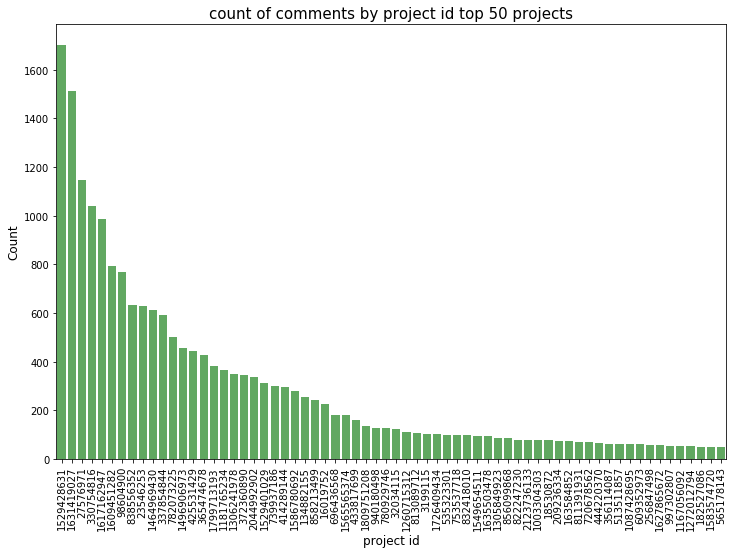

In [11]:
cnt_srs = df_en.id.value_counts()
color = sns.color_palette()

plt.figure(figsize=(12,8))
sns.barplot(cnt_srs.index, cnt_srs.values, alpha=0.8, color=color[2],order=df2['id'])
plt.ylabel('Count', fontsize=12)
plt.xlabel('project id', fontsize=12)
plt.xticks(rotation='vertical')
plt.title("count of comments by project id top 50 projects", fontsize=15)
plt.show()

## Project Status Distribution

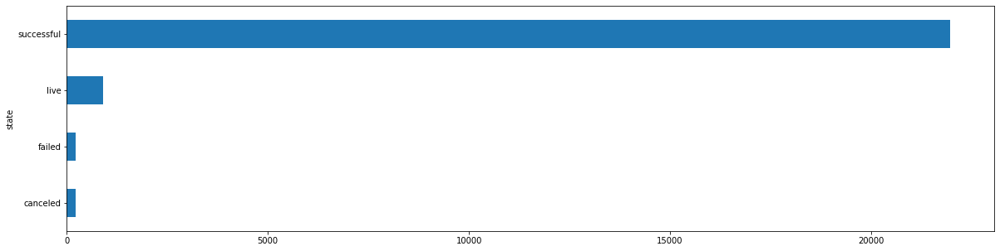

In [12]:
# classified by successful, live, failed and canceled 
# The majority are successful 
df_en.groupby(['state']).size().plot.barh(figsize = (20,5))


## Classified by country

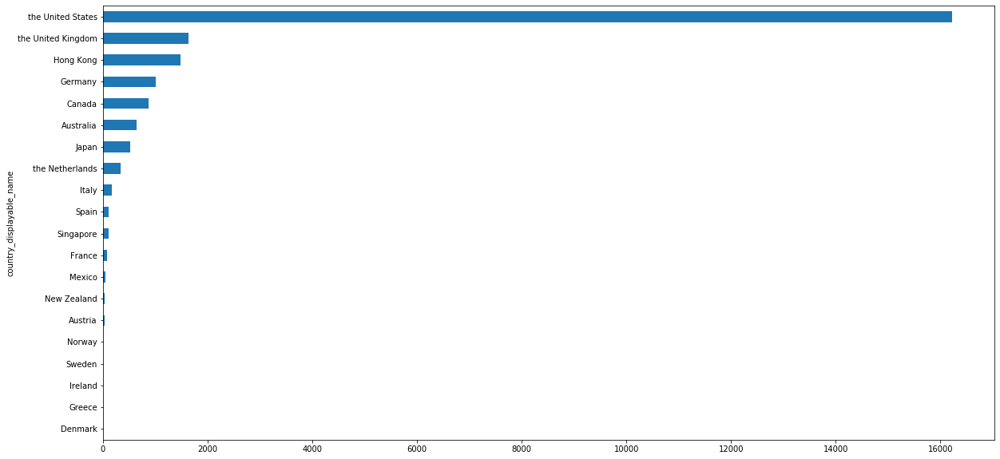

In [83]:
# The US has the most projects 
df_en.groupby(['country_displayable_name']).size().sort_values(ascending=True).plot.barh(figsize = (20,10))
# plt.show()
plt.savefig('bycountry.jpg')

In [53]:
temp = df_en.groupby(['id']).count()
temp2 = temp.merge(df_en,on='id')
temp2


,id,Title_x,Name_x,Type_x,Comment_URL_x,Period_x,project_x,project_name_x,backers_count_x,blurb_x,...,pledged_y,profile_y,slug_y,state_y,static_usd_rate_y,urls_y,usd_pledged_y,has_y,language_y,progress_y
0,3199115,104,104,39,104,104,104,104,104,104,...,55191.00,"{""id"":1853057,""project_id"":1853057,""state"":""ac...",bill-mantlo-and-butch-guices-swords-of-the-swa...,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",55191.00,True,en,5.809579
1,3199115,104,104,39,104,104,104,104,104,104,...,55191.00,"{""id"":1853057,""project_id"":1853057,""state"":""ac...",bill-mantlo-and-butch-guices-swords-of-the-swa...,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",55191.00,True,en,5.809579
2,3199115,104,104,39,104,104,104,104,104,104,...,55191.00,"{""id"":1853057,""project_id"":1853057,""state"":""ac...",bill-mantlo-and-butch-guices-swords-of-the-swa...,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",55191.00,True,en,5.809579
3,3199115,104,104,39,104,104,104,104,104,104,...,55191.00,"{""id"":1853057,""project_id"":1853057,""state"":""ac...",bill-mantlo-and-butch-guices-swords-of-the-swa...,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",55191.00,True,en,5.809579
4,3199115,104,104,39,104,104,104,104,104,104,...,55191.00,"{""id"":1853057,""project_id"":1853057,""state"":""ac...",bill-mantlo-and-butch-guices-swords-of-the-swa...,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",55191.00,True,en,5.809579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23309,2136406670,6,6,1,6,6,6,6,6,6,...,80628.01,"{""id"":2238088,""project_id"":2238088,""state"":""ac...",in-search-of-the-truth-the-truth-booth-us-tour,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",80628.01,True,en,1.075040
23310,2136406670,6,6,1,6,6,6,6,6,6,...,80628.01,"{""id"":2238088,""project_id"":2238088,""state"":""ac...",in-search-of-the-truth-the-truth-booth-us-tour,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",80628.01,True,en,1.075040
23311,2136406670,6,6,1,6,6,6,6,6,6,...,80628.01,"{""id"":2238088,""project_id"":2238088,""state"":""ac...",in-search-of-the-truth-the-truth-booth-us-tour,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",80628.01,True,en,1.075040
23312,2143594036,2,2,0,2,2,2,2,2,2,...,281.00,"{""id"":2166917,""project_id"":2166917,""state"":""in...",starving-art-comic-book,failed,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",281.00,True,en,0.165294


In [55]:
temp3 = temp2[['id','country_displayable_name_y','state_y']]

In [56]:
temp3

,id,country_displayable_name_y,state_y
0,3199115,the United States,successful
1,3199115,the United States,successful
2,3199115,the United States,successful
3,3199115,the United States,successful
4,3199115,the United States,successful
...,...,...,...
23309,2136406670,the United States,successful
23310,2136406670,the United States,successful
23311,2136406670,the United States,successful
23312,2143594036,the United States,failed


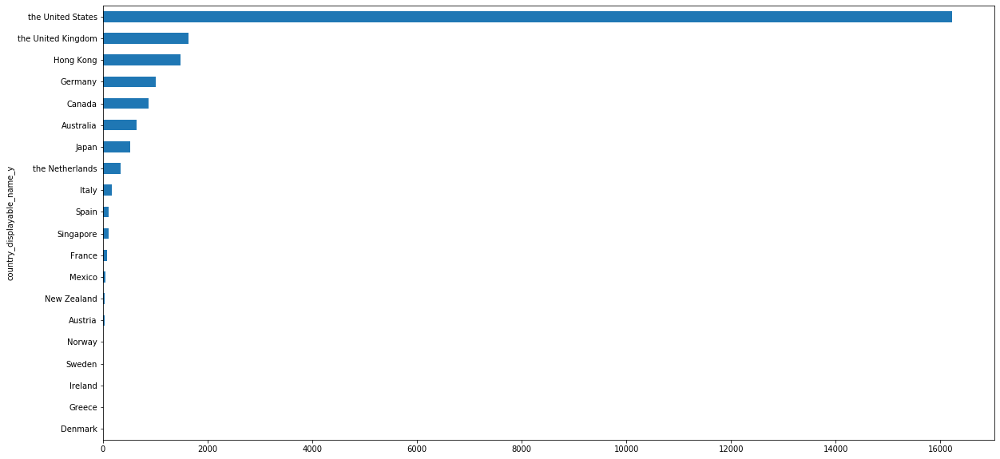

In [58]:
# by country on project level
temp3.groupby(['country_displayable_name_y']).size().sort_values(ascending=True).plot.barh(figsize = (20,10))
plt.show()

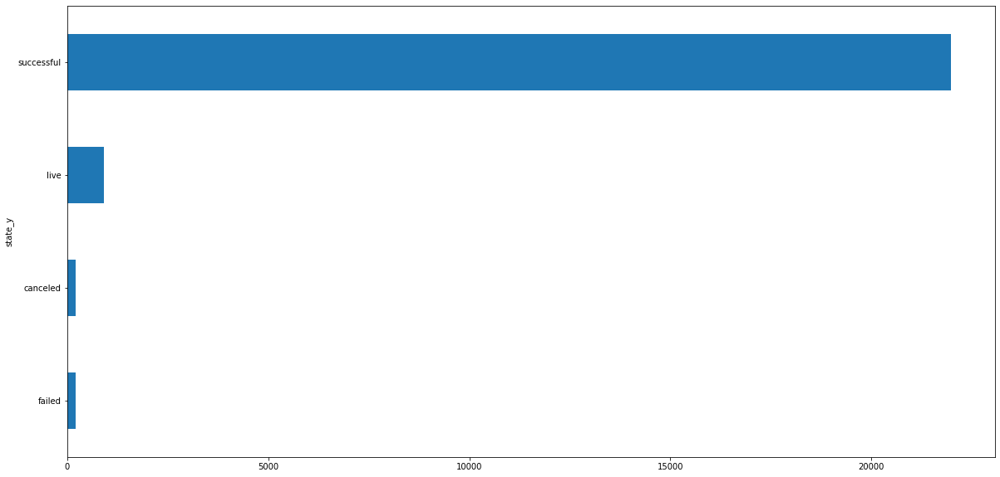

In [59]:
# by state on project level
temp3.groupby(['state_y']).size().sort_values(ascending=True).plot.barh(figsize = (20,10))
plt.show()

# Project By Category

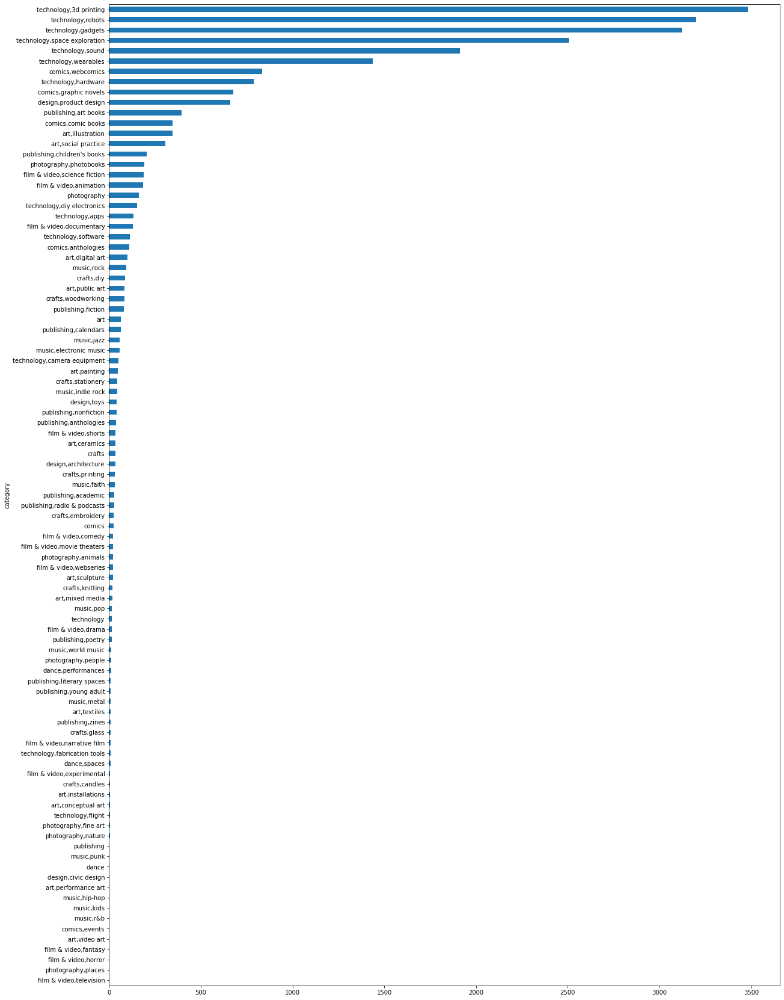

In [190]:
# comment count 
df_en.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
# plt.show()
plt.savefig('by_kickstarter_category.jpg')

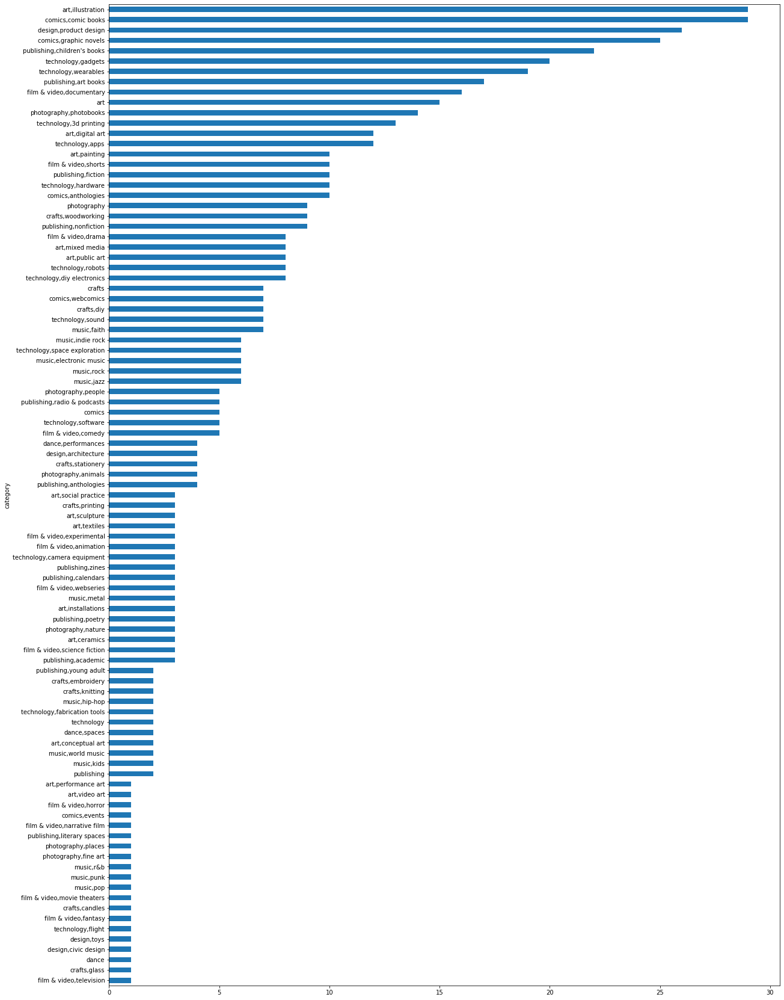

In [192]:
# project count 
df_blurb.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
# plt.show()
plt.savefig('by_kickstarter_category_by_proj.jpg')

## Project Progress

In [43]:
# progress is defined as the amount pledged / goal 
df_en['progress'] = df_en['pledged']/df_en['goal']
df_sort_by_progress = df_en.sort_values(by='progress',ascending=False)

# projects that are successful aka pledge > goal - 487 projects 
id_more_than_100 = df_sort_by_progress[df_sort_by_progress['progress'] >= 1].id.unique()

/Users/Hanyu/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [15]:
len(id_more_than_100)

487

## Those raised more than 2x the goal are deemed as exceptional 

In [44]:
# take those project with progress > 2 
# 189 projects fulfilled this requirement

df_more_than_2 = df_en[df_en['progress'] > 2]
# df_more_than_2.drop_duplicates(subset=['id'],inplace=True)
df_more_than_2 = df_more_than_2.sort_values(by='progress',ascending=False)

In [196]:
df_more_than_2 # at the comment level 

,Title,Name,Type,Comment_URL,Period,...,urls,usd_pledged,has,language,progress
24427,Hi! Did you guys by chance take any photos of last night’s “Christmas Star”? It’s actually Jupiter and Saturn lined up fir the first time in 800 years. You could see the star w naked eye but Dwarf would probably be able to take a phenomenal photo. There will be another chance to see it tonight just after sunset if you have clear skies. You can google Christmas Star and it will tell you more about it. It won’t happen again for another 60 plus years. PLEASE take some photos for us!,David Marburger,NaN,nyscope/dwarf-telescopea-portable-digital-telescope/comments?comment=Q29tbWVudC0zMTAyNDY2OQ%3D%3D,3 months ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope/rewards""}}",237256.241806,True,en,156.196175
24272,Is it right amount? Hi I added money for Scope with wifibox and pan/tilt.,Jan-Erik Matz,Creator,nyscope/dwarf-telescopea-portable-digital-telescope/comments?comment=Q29tbWVudC0zMDU3MzA3OQ%3D%3D,4 months ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope/rewards""}}",237256.241806,True,en,156.196175
24270,Please check. Added 2000 to the pledge for a WiFi module add-on,Henry,Creator,nyscope/dwarf-telescopea-portable-digital-telescope/comments?comment=Q29tbWVudC0zMDU2NTAyOA%3D%3D,4 months ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope/rewards""}}",237256.241806,True,en,156.196175
24269,"Hello, just added 2000 JPY for adding a wi-fi module to my pledge. Please make a note for me!Thank you so much!",Steve Lai,Creator,nyscope/dwarf-telescopea-portable-digital-telescope/comments?comment=Q29tbWVudC0zMDU2NDE4NA%3D%3D,4 months ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope/rewards""}}",237256.241806,True,en,156.196175
24268,Hi. I have added 2000 JPY for adding a wi-fi module to my pledge. Thank you.,Tetyana Gerihanova,Creator,nyscope/dwarf-telescopea-portable-digital-telescope/comments?comment=Q29tbWVudC0zMDU2MTYzNw%3D%3D,4 months ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/tinyscope/dwarf-telescopea-portable-digital-telescope/rewards""}}",237256.241806,True,en,156.196175
...,...,...,...,...,...,...,...,...,...,...,...
3362,"Can several units be daisy-chained ? if not , it would be a cool feature to have over several rooms or to create a more immersive sound . what would be the technical challenge to do this ?",Uwe,NaN,1997459245/blitzwolf-as1-more-than-just-a-speakerits-an-artwo/comments?comment=Q29tbWVudC0xOTI4MjkzNA%3D%3D,about 3 years ago,...,"{""web"":{""project"":""https://www.kickstarter.com/projects/1997459245/blitzwolf-as1-more-than-just-a-speakerits-an-artwo?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/1997459245/blitzwolf-as1-more-than-just-a-speakerits-an-artwo/rewards""}}",12934.906136,True,en,2.023560
3361,"Does anyone know what the lights mean on speaker its changing from pink to red and blue, manual does not say , only red for charging is mentioned.",brian vella,NaN,1997459245/blitzwolf-as1-more-than-just-a-

In [212]:
df_more_than_2_proj = df_more_than_2.groupby(['id']).mean().sort_values(by=['progress'],ascending =False)

df_more_than_2_proj # at the project level 

,backers_count,converted_pledged_amount,fx_rate,goal,pledged,static_usd_rate,usd_pledged,has,progress
id,,,,,,,,,
365474678,1331,240105,0.009612,160000.0,24991388.0,0.009494,237256.241806,True,156.196175
1627865672,1489,125981,1.290223,1000.0,97643.0,1.000000,97643.000000,True,97.643000
711107729,693,67794,1.000000,1000.0,67794.0,1.000000,67794.000000,True,67.794000
1003304303,46,22268,0.754370,500.0,29519.0,0.750807,22163.058549,True,59.038000
940180498,408,114748,1.000000,2000.0,114748.0,1.000000,114748.000000,True,57.374000
...,...,...,...,...,...,...,...,...,...
2119292474,84,1235,1.000000,600.0,1235.0,1.000000,1235.000000,True,2.058333
377535306,49,24186,1.214980,10000.0,20580.0,1.163570,23946.271012,True,2.058000
137938361,15,938,0.786317,600.0,1231.5,0.780903,961.681872,True,2.052500


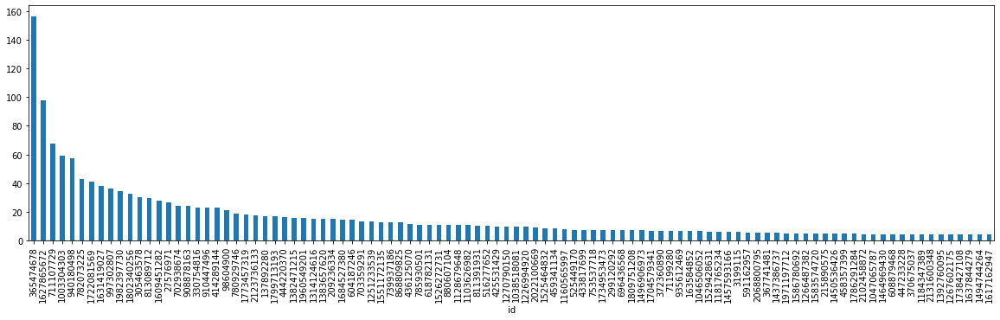

In [200]:
figure = plt.figure(figsize=(20,5))

# we visualise the top 100 projects 

df_more_than_2_proj['progress'][:100].plot.bar()
plt.show()

##  exceptional project by category

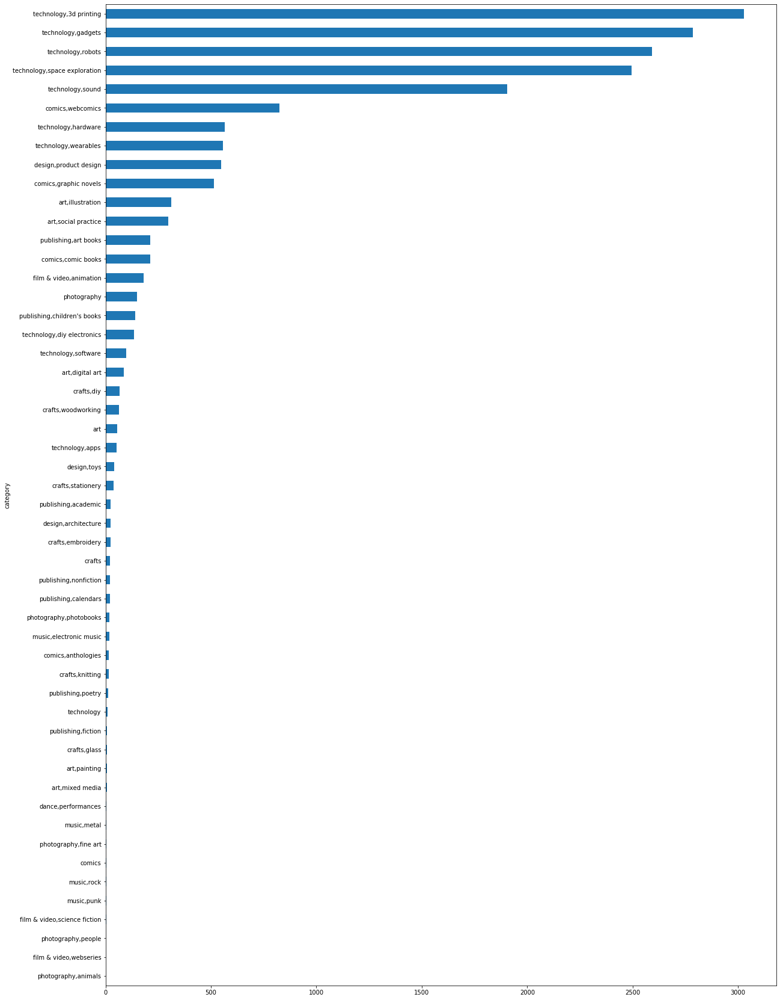

In [205]:
# comment count 
df_more_than_2.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
plt.show()
# plt.savefig('by_kickstarter_category.jpg')

In [214]:
df_more_than_2_proj= df_more_than_2.drop_duplicates(subset=['id'])

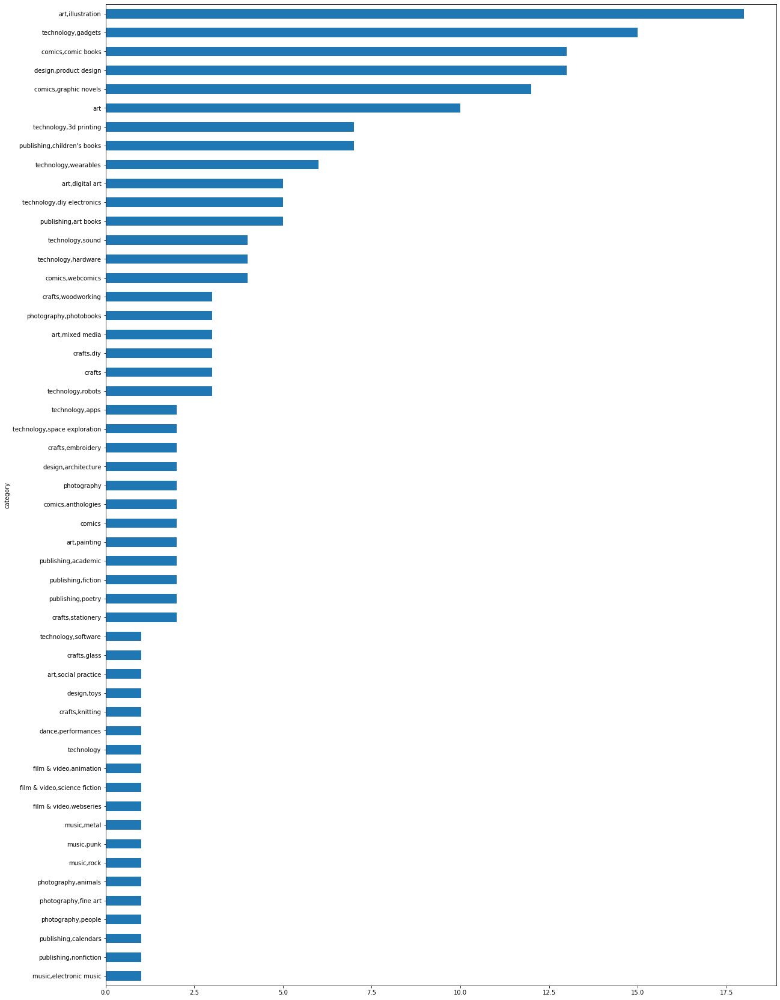

In [216]:
# proj count 
df_more_than_2_proj.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
plt.show()
# plt.savefig('by_kickstarter_category.jpg')

## Projects that has Pledged > Goal

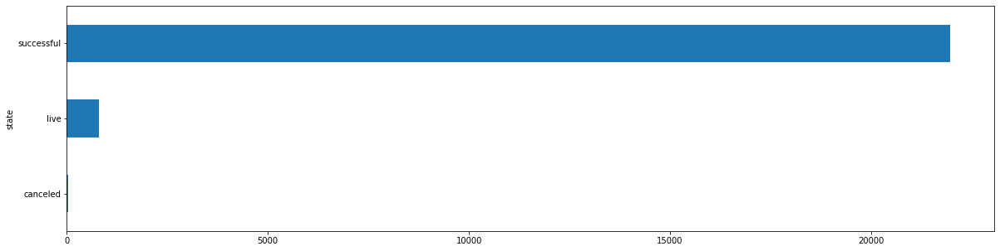

In [220]:
# see what are their status - majority are successful; no failed 
more_than_100_df = df_en[df_en.id.isin(id_more_than_100)]
more_than_100_df_proj= more_than_100_df.drop_duplicates(subset=['id'])

#by comments 
more_than_100_df.groupby(['state']).size().plot.barh(figsize = (20,5))


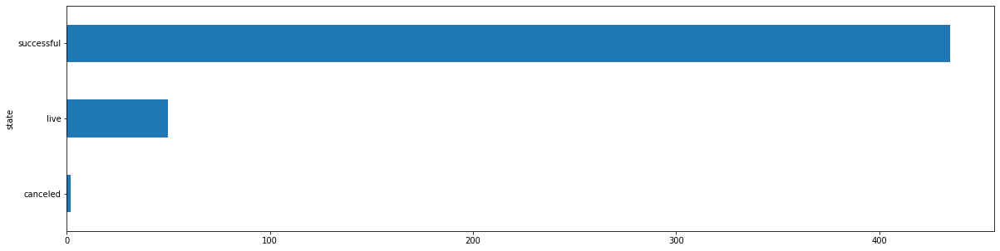

In [221]:
more_than_100_df_proj.groupby(['state']).size().plot.barh(figsize = (20,5))


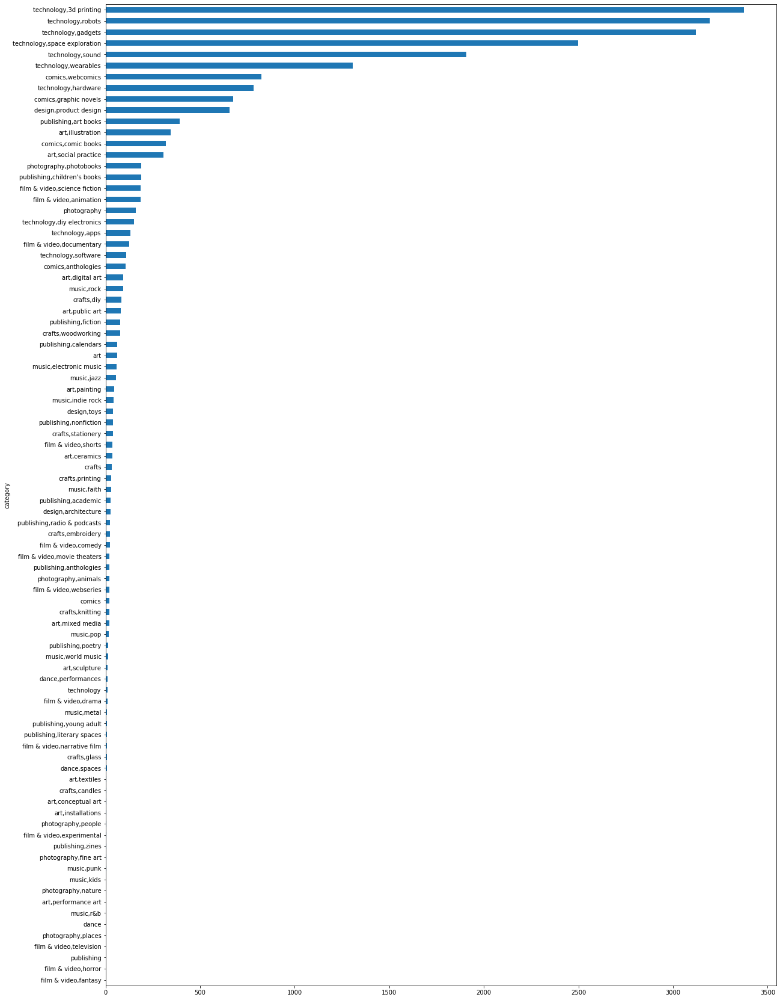

In [218]:
# pledged > goal by category 
# by comments 
more_than_100_df.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
plt.show()
# plt.savefig('by_kickstarter_category.jpg')

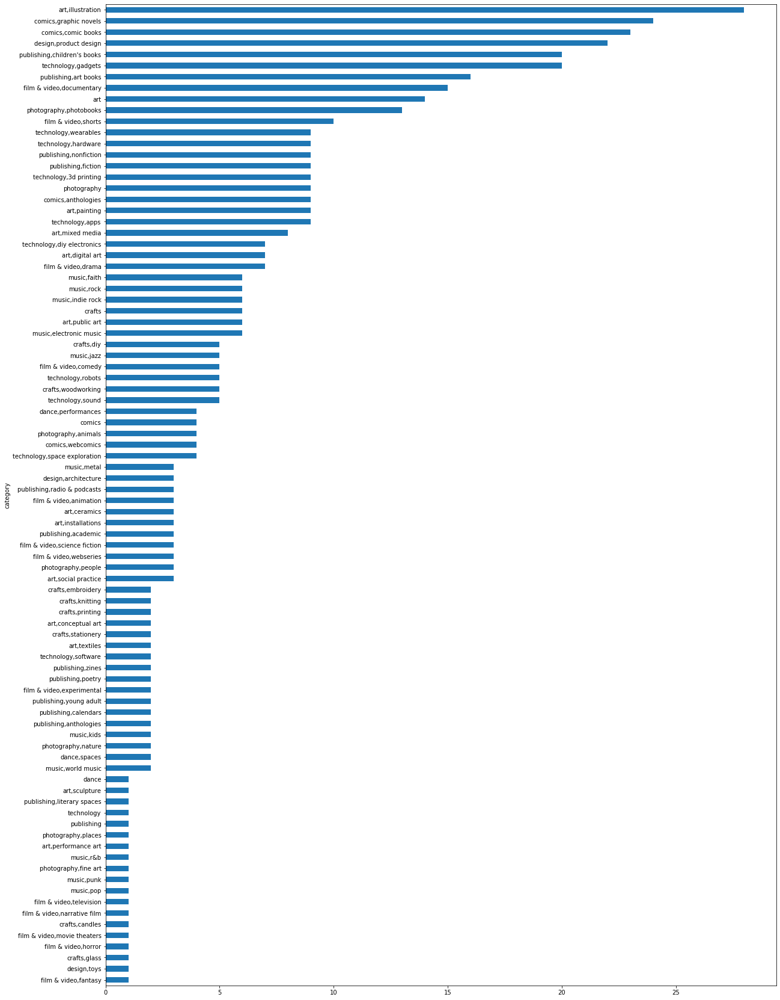

In [222]:
# pledged > goal by category 
# by project 
more_than_100_df_proj.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
plt.show()
# plt.savefig('by_kickstarter_category.jpg')

## Group those pledged > goals by country

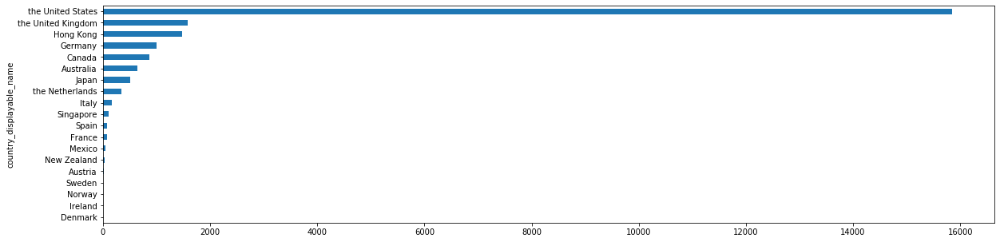

In [223]:
# by comments
more_than_100_df.groupby(['country_displayable_name']).size().sort_values(ascending=True).plot.barh(figsize = (20,5))
plt.show()


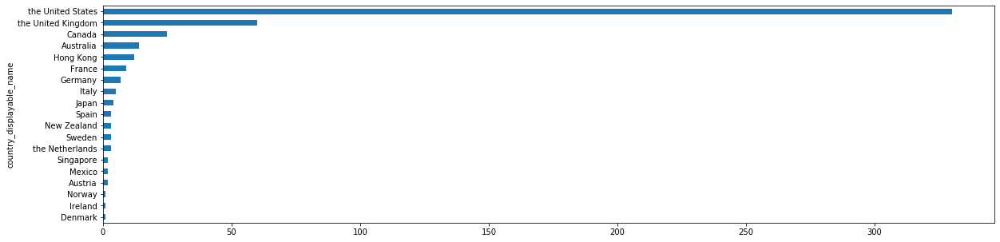

In [224]:
# by proj
more_than_100_df_proj.groupby(['country_displayable_name']).size().sort_values(ascending=True).plot.barh(figsize = (20,5))
plt.show()


# Vader Sentiment Analysis
1. pos, neu and neg are proportion ratio 
2. Compound score is a normalised measure to determine the sentence sentiment

In [11]:
def vader(column,original_df):
    analyzer = SentimentIntensityAnalyzer()
    new_df = original_df.copy()
    new_df['compound'] = [analyzer.polarity_scores(x)['compound'] for x in original_df[column]]
    new_df['neg'] = [analyzer.polarity_scores(x)['neg'] for x in original_df[column]]
    new_df['neu'] = [analyzer.polarity_scores(x)['neu'] for x in original_df[column]]
    new_df['pos'] = [analyzer.polarity_scores(x)['pos'] for x in original_df[column]]
    return new_df

## Comments

In [36]:
df_comment_v = vader('Title',df_comment)
df_comment_v

,Title,id,category,project,compound,neg,neu,pos
1,"I backed at the early bird hard cover, but is ...",412975852,"comics,graphic novels",travis-hansons-the-bean-in-full-color,-0.1306,0.051,0.915,0.034
2,this is so great I want it so much!,412975852,"comics,graphic novels",travis-hansons-the-bean-in-full-color,0.7962,0.000,0.497,0.503
3,looking forward to this - keep us updated in K...,412975852,"comics,graphic novels",travis-hansons-the-bean-in-full-color,0.0000,0.000,1.000,0.000
4,Glad to see this campaign come to fruition. I ...,412975852,"comics,graphic novels",travis-hansons-the-bean-in-full-color,0.2500,0.000,0.956,0.044
5,Congrats on hitting the goal! So keen to final...,412975852,"comics,graphic novels",travis-hansons-the-bean-in-full-color,0.9342,0.000,0.498,0.502
...,...,...,...,...,...,...,...,...
25153,"No apology needed. Life happens, I hope you ca...",1272012794,"photography,photobooks",dusty-playground,0.4122,0.067,0.763,0.170
25154,I am very happy to read your update tonight! ...,1272012794,"photography,photobooks",dusty-playground,0.9933,0.017,0.688,0.295
25155,Jeff done said it better than I could. Do what...,1272012794,"photography,photobooks",dusty-playground,0.4404,0.000,0.828,0.172
25156,Are you planning on going to BM this year to t...,1272012794,"photography,photobooks",dusty-playground,0.0000,0.066,0.867,0.066


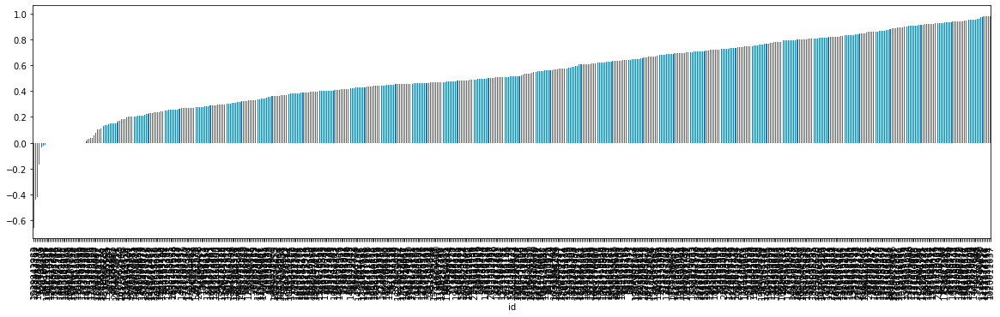

In [84]:
df_comment_v.groupby(['id']).mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))
# plt.show()
plt.savefig('comment_v_compound.jpg')

In [97]:
temp_v = df_comment_v.groupby(['id']).mean().sort_values("compound",ascending = False)
temp_v

,compound,neg,neu,pos
id,,,,
1020011037,0.980000,0.035000,0.685,0.279000
1124045194,0.979500,0.000000,0.631,0.369000
134130219,0.977300,0.000000,0.545,0.455000
1433074546,0.976500,0.023000,0.713,0.263000
1311521571,0.976000,0.000000,0.517,0.483000
...,...,...,...,...
650492275,-0.088688,0.154625,0.795,0.050312
1078634931,-0.164550,0.082000,0.918,0.000000
767947731,-0.421500,0.183000,0.817,0.000000


In [106]:
#  project with the highest score in v-sentiment 
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
df[df['id'] ==1020011037]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,converted_pledged_amount,country,country_displayable_name,currency,current_currency,fx_rate,goal,id,location,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
7063,"Congrats Sam, it is a great idea and I look forward to watching and if given the chance to participate I'll be there. I'm a truckin biker of the old school I make more time to ride these days as I have been a successful owner-operator in the trucking business. As a cold war vet from '69 to '71 I relish experiencing our great countries history and meeting the folks who hold secrets and stories not readily available to most. Best wishes and best of luck.",Steve Davenport,NaN,842534549/kicks-on-route-66/comments?comment=Q29tbWVudC0xMDUwNzA5OA%3D%3D,over 5 years ago,kicks-on-route-66,kicks on route 66,92,"Our Pilot explores Route 66, its history and the excitement and adventures only bikers can find along the way.","{""id"":303,""name"":""Television"",""slug"":""film & video/television"",""position"":17,""parent_id"":11,""parent_name"":""Film & Video"",""color"":16734574,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/film%20&%20video/television""}}}",30121,US,the United States,USD,USD,1.0,25000.0,1020011037,"{""id"":2424766,""name"":""Houston"",""slug"":""houston-tx"",""short_name"":""Houston, TX"",""displayable_name"":""Houston, TX"",""localized_name"":""Houston"",""country"":""US"",""state"":""TX"",""type"":""Town"",""is_root"":false,""expanded_country"":""United States"",""urls"":{""web"":{""discover"":""https://www.kickstarter.com/discover/places/houston-tx"",""location"":""https://www.kickstarter.com/locations/houston-tx""},""api"":{""nearby_projects"":""https://api.kickstarter.com/v1/discover?signature=1610673590.1451cb062d873525bc7f8b4ebff3843c9ad83436&woe_id=2424766""}}}",Kicks on Route 66,30121.0,"{""id"":1826454,""project_id"":1826454,""state"":""active"",""state_changed_at"":1436797013,""name"":""Kicks on Route 66"",""blurb"":""Our Pilot explores Route 66, its history and the excitement and adventures only bikers can find along the way."",""background_color"":""f8faf7"",""text_color"":"""",""link_background_color"":"""",""link_text_color"":"""",""link_text"":""Follow along!"",""link_url"":"""",""show_feature_image"":true,""background_image_opacity"":0.8,""feature_image_attributes"":{""id"":4140343,""image_urls"":{""default"":""https://ksr-ugc.imgix.net/assets/004/140/343/634333795c3e4b2f681974cd967c4f5e_original.JPG?ixlib=rb-2.1.0&w=700&fit=max&v=1436800192&auto=format&frame=1&q=92&s=fb1b069d322713608881daf5573158ff"",""baseball_card"":""https://ksr-ugc.imgix.net/assets/004/140/343/634333795c3e4b2f681974cd967c4f5e_original.JPG?ixlib=rb-2.1.0&crop=faces%2Cedges&w=560&h=315&fit=crop&v=1436800192&auto=format&frame=1&q=92&s=8dc794e2534c7aa315d7202857c7f95a""}},""should_show_feature_image_section"":true}",kicks-on-route-66,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com/projects/842534549/kicks-on-route-66?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/842534549/kicks-on-route-66/rewards""}}",30121.0,True,en


In [110]:
# from vader projects with the most negative scores from compound 
temp_v_bad = df_comment_v.groupby(['id']).mean().sort_values("compound",ascending = True)
temp_v_bad

,compound,neg,neu,pos
id,,,,
1529942983,-0.655200,0.349000,0.651000,0.000000
2088443769,-0.440400,0.282000,0.574000,0.144000
767947731,-0.421500,0.183000,0.817000,0.000000
1078634931,-0.164550,0.082000,0.918000,0.000000
650492275,-0.088688,0.154625,0.795000,0.050312
100788089,-0.033750,0.129500,0.780000,0.090500
324101142,-0.023150,0.083250,0.778000,0.138750
940180498,-0.016915,0.080700,0.827746,0.091592
1581953517,-0.003900,0.132875,0.812125,0.054875


In [111]:
df[df['id'] ==1529942983]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,converted_pledged_amount,country,country_displayable_name,currency,current_currency,fx_rate,goal,id,location,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
7980,"Fuck it, why not. But you better hit someone with that stick.",Jonathan Wilson,NaN,garybusey/taking-selfies-of-people-taking-selfies-with-selfi/comments?comment=Q29tbWVudC05MDU0MDk2,about 6 years ago,taking-selfies-of-people-taking-selfies-with-selfi,taking selfies of people taking selfies with selfi,6,I'm making a selfie stick that's twice the length of regular selfie sticks. I will take selfies of people taking selfies in public.,"{""id"":21,""name"":""Digital Art"",""slug"":""art/digital art"",""position"":3,""parent_id"":1,""parent_name"":""Art"",""color"":16760235,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/art/digital%20art""}}}",82,US,the United States,USD,USD,1.0,300.0,1529942983,"{""id"":2490383,""name"":""Seattle"",""slug"":""seattle-wa"",""short_name"":""Seattle, WA"",""displayable_name"":""Seattle, WA"",""localized_name"":""Seattle"",""country"":""US"",""state"":""WA"",""type"":""Town"",""is_root"":false,""expanded_country"":""United States"",""urls"":{""web"":{""discover"":""https://www.kickstarter.com/discover/places/seattle-wa"",""location"":""https://www.kickstarter.com/locations/seattle-wa""},""api"":{""nearby_projects"":""https://api.kickstarter.com/v1/discover?signature=1610673381.0d8ecc008d2a602b5d023c07f46248c79eca11ba&woe_id=2490383""}}}",Taking Selfies of People Taking Selfies with Selfie Sticks,82.0,"{""id"":1708949,""project_id"":1708949,""state"":""inactive"",""state_changed_at"":1425915894,""name"":null,""blurb"":null,""background_color"":null,""text_color"":null,""link_background_color"":null,""link_text_color"":null,""link_text"":null,""link_url"":null,""show_feature_image"":false,""background_image_opacity"":0.8,""should_show_feature_image_section"":true,""feature_image_attributes"":{""image_urls"":{""default"":""https://ksr-ugc.imgix.net/assets/012/038/748/8ea28efae2cf81465b9da35db074f21d_original.jpg?ixlib=rb-2.1.0&crop=faces&w=1552&h=873&fit=crop&v=1463726319&auto=format&frame=1&q=92&s=1ca9c30bf2ed803854ab698e5e534faf"",""baseball_card"":""https://ksr-ugc.imgix.net/assets/012/038/748/8ea28efae2cf81465b9da35db074f21d_original.jpg?ixlib=rb-2.1.0&crop=faces&w=560&h=315&fit=crop&v=1463726319&auto=format&frame=1&q=92&s=48195918d30801aba6f15b2ba14f196b""}}}",taking-selfies-of-people-taking-selfies-with-selfi,failed,1.0,"{""web"":{""project"":""https://www.kickstarter.com/projects/atomicgarybusey/taking-selfies-of-people-taking-selfies-with-selfi?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/atomicgarybusey/taking-selfies-of-people-taking-selfies-with-selfi/rewards""}}",82.0,True,en


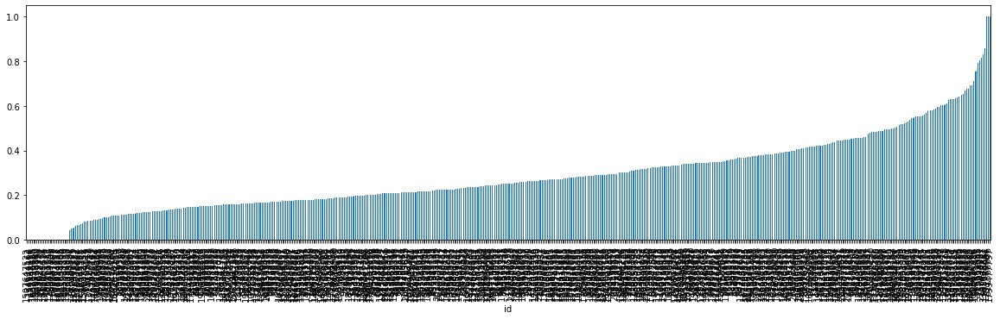

In [25]:
df_comment_v.groupby(['id']).mean().sort_values("pos")['pos'].plot.bar(figsize = (20,5))
plt.show()

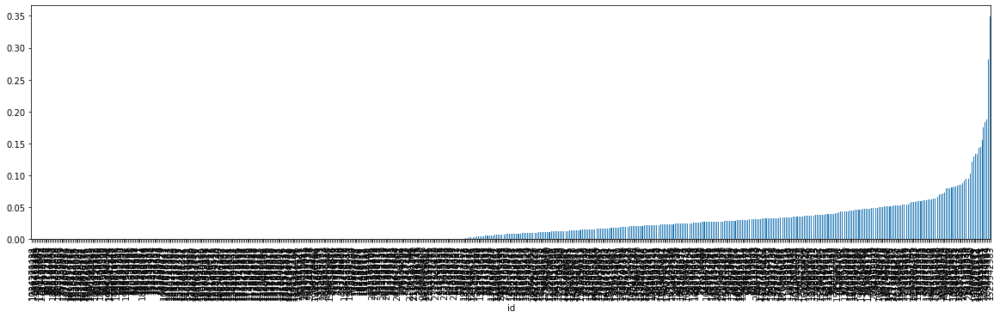

In [26]:
df_comment_v.groupby(['id']).mean().sort_values("neg")['neg'].plot.bar(figsize = (20,5))
plt.show()

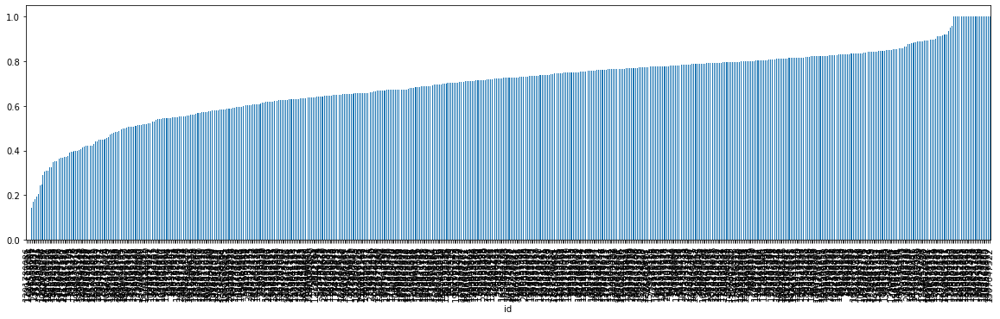

In [27]:
df_comment_v.groupby(['id']).mean().sort_values("neu")['neu'].plot.bar(figsize = (20,5))
plt.show()

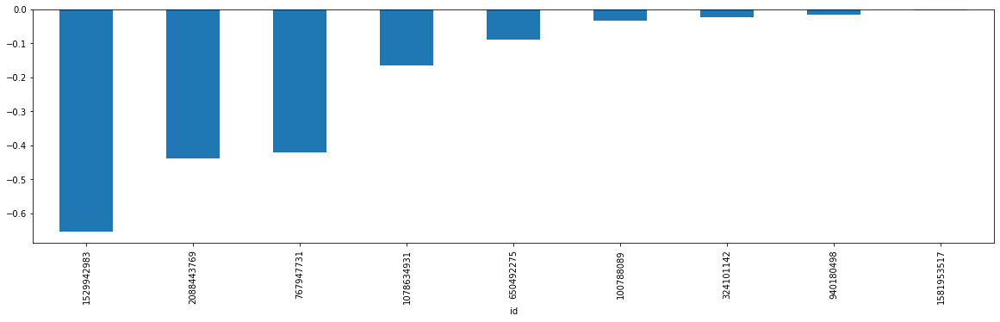

In [28]:
# Projects with compound values < 0 
temp = df_comment_v.groupby(['id']).mean().sort_values("compound")
df_comment_v_com_neg = temp[temp['compound'] < 0]
df_comment_v_com_neg['compound'].plot.bar(figsize = (20,5))
plt.show()

## by category

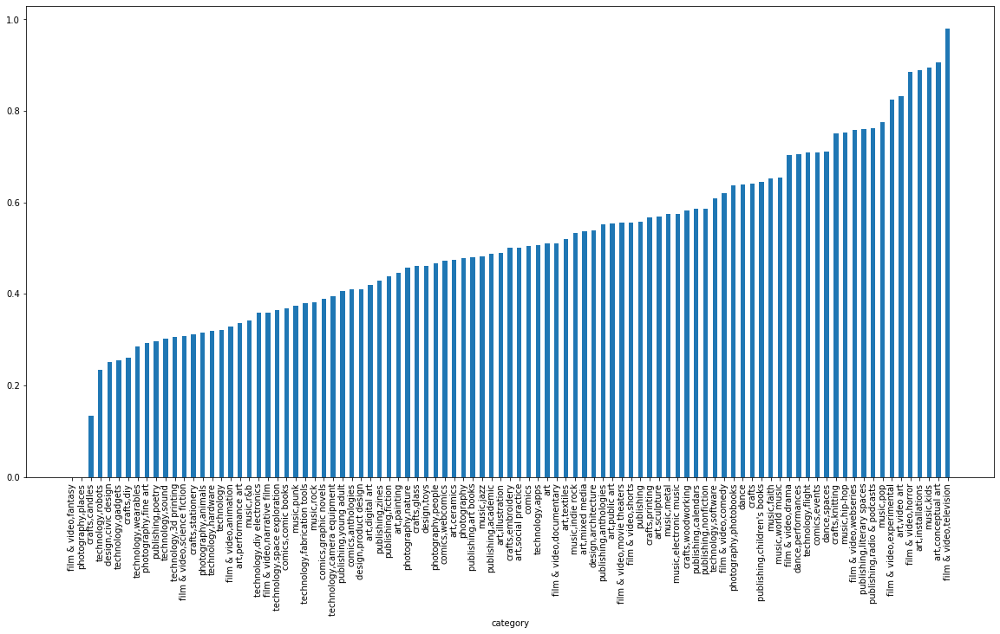

In [256]:
# by comments 
# df_comment_v.groupby(['category']).size().sort_values(ascending=True)['compound'].plot.barh(figsize = (20,30))
plt.figure(figsize=(20,20))

df_comment_v.groupby(['category']).mean().sort_values("compound")['compound'].plot.bar(figsize = (20,10))
plt.autoscale()
# plt.show()
plt.savefig('test.jpg')

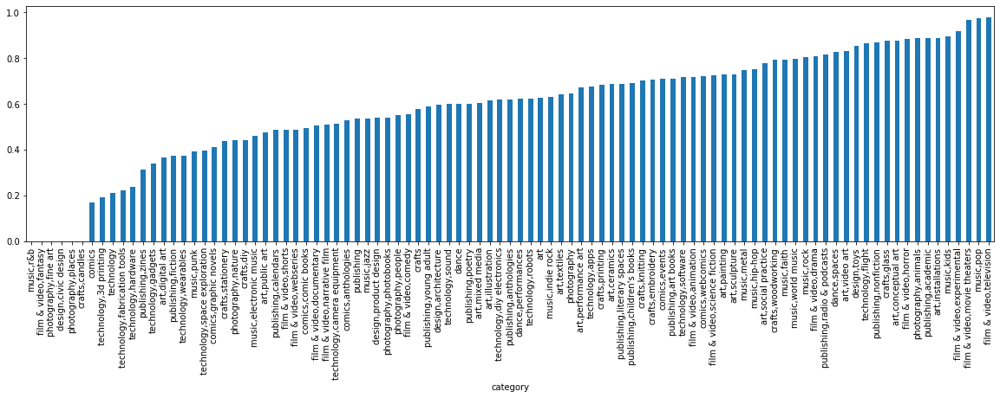

In [249]:
# by proj 
df_comment_v_proj = df_comment_v.drop_duplicates(subset=['id'])
df_comment_v_proj.groupby(['category']).mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))

# plt.show()
plt.savefig('compound_by_category.jpg')

## Blurb

In [12]:
df_blurb_v = vader('blurb',df_blurb)
df_blurb_v


,blurb,id,category,compound,neg,neu,pos
0,Adventure into the World of the Broken Moon wi...,412975852,"comics,graphic novels",0.2003,0.115,0.704,0.181
1,Are you still suffering sport injuries? Just...,182527086,"technology,wearables",0.0258,0.146,0.704,0.150
2,Dry-active is a smart wearable device that sol...,901566235,"technology,wearables",0.2732,0.102,0.717,0.181
3,"Two potters building a communal woodkiln, to g...",1786261910,"art,ceramics",0.0000,0.000,1.000,0.000
4,A short film about a father and son on the run...,1777707042,"film & video,drama",0.0000,0.000,1.000,0.000
...,...,...,...,...,...,...,...
584,A graphic nonfiction history of women-led move...,1227010510,"comics,graphic novels",-0.3182,0.103,0.897,0.000
585,Reboot a classic Bridgestone X0-1 replica trib...,309561756,"design,product design",0.0000,0.000,1.000,0.000
586,"Set in 15th century West Africa, follow the ex...",1553989685,"comics,graphic novels",-0.1027,0.179,0.693,0.128
587,Learn Chinese the FUN way with this interactiv...,1382970500,"publishing,children's books",0.6514,0.000,0.735,0.265


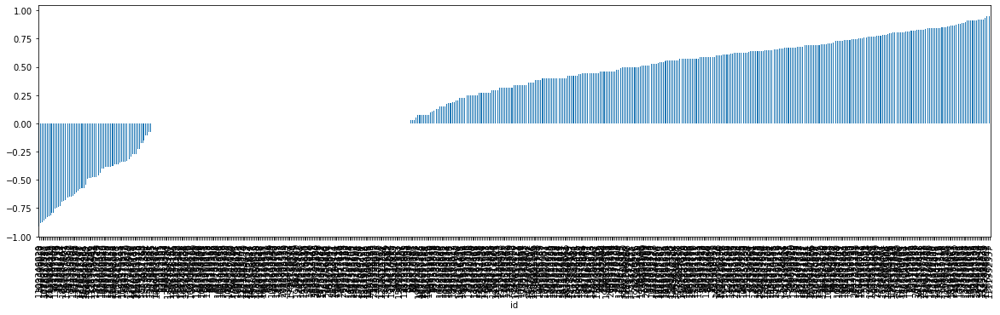

In [13]:
# the neutral gap is much larger 
df_blurb_v.groupby(['id']).mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))
plt.show()

In [15]:
df_blurb_v_neg_compound = df_blurb_v[df_blurb_v['compound'] <0]

In [31]:
# 159 projects have neutral blurb 
df_blurb_v[df_blurb_v['compound'] == 0]

,blurb,id,compound,neg,neu,pos
3,"Two potters building a communal woodkiln, to g...",1786261910,0.0,0.0,1.0,0.0
4,A short film about a father and son on the run...,1777707042,0.0,0.0,1.0,0.0
7,"A portable, lightweight camera jib designed sp...",617453891,0.0,0.0,1.0,0.0
8,"Access to 3D printers without the $4,000 price...",2040039974,0.0,0.0,1.0,0.0
13,The Giant Flowers is a public art piece featur...,886180903,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...
567,"Ultrafaux's 2nd record, Deuxième & Hot Club of...",586455342,0.0,0.0,1.0,0.0
579,A monumental public art installation bringing ...,1981674234,0.0,0.0,1.0,0.0
582,Desktop 3D printer.,535323301,0.0,0.0,1.0,0.0
585,Reboot a classic Bridgestone X0-1 replica trib...,309561756,0.0,0.0,1.0,0.0


In [32]:
blurb_neg = df_blurb_v[df_blurb_v['compound'] <= 0 ].id

## Exceptional projects

In [33]:
df_more_than_2_v = vader('Title',df_more_than_2)
df_more_than_2_v


,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,static_usd_rate,urls,usd_pledged,has,language,progress,compound,neg,neu,pos
24427,Hi! Did you guys by chance take any photos of ...,David Marburger,NaN,nyscope/dwarf-telescopea-portable-digital-tele...,3 months ago,dwarf-telescopea-portable-digital-telescope,dwarf telescopea portable digital telescope,1331,See your friends clearly from 1000 meters away,"{""id"":52,""name"":""Hardware"",""slug"":""technology/...",...,0.009494,"{""web"":{""project"":""https://www.kickstarter.com...",237256.241806,True,en,156.196175,0.9008,0.000,0.880,0.120
24272,Is it right amount? Hi I added money for Scope...,Jan-Erik Matz,Creator,nyscope/dwarf-telescopea-portable-digital-tele...,4 months ago,dwarf-telescopea-portable-digital-telescope,dwarf telescopea portable digital telescope,1331,See your friends clearly from 1000 meters away,"{""id"":52,""name"":""Hardware"",""slug"":""technology/...",...,0.009494,"{""web"":{""project"":""https://www.kickstarter.com...",237256.241806,True,en,156.196175,0.0000,0.000,1.000,0.000
24270,Please check. Added 2000 to the pledge for a W...,Henry,Creator,nyscope/dwarf-telescopea-portable-digital-tele...,4 months ago,dwarf-telescopea-portable-digital-telescope,dwarf telescopea portable digital telescope,1331,See your friends clearly from 1000 meters away,"{""id"":52,""name"":""Hardware"",""slug"":""technology/...",...,0.009494,"{""web"":{""project"":""https://www.kickstarter.com...",237256.241806,True,en,156.196175,0.3182,0.000,0.827,0.173
24269,"Hello, just added 2000 JPY for adding a wi-fi ...",Steve Lai,Creator,nyscope/dwarf-telescopea-portable-digital-tele...,4 months ago,dwarf-telescopea-portable-digital-telescope,dwarf telescopea portable digital telescope,1331,See your friends clearly from 1000 meters away,"{""id"":52,""name"":""Hardware"",""slug"":""technology/...",...,0.009494,"{""web"":{""project"":""https://www.kickstarter.com...",237256.241806,True,en,156.196175,0.4374,0.000,0.879,0.121
24268,Hi. I have added 2000 JPY for adding a wi-fi m...,Tetyana Gerihanova,Creator,nyscope/dwarf-telescopea-portable-digital-tele...,4 months ago,dwarf-telescopea-portable-digital-telescope,dwarf telescopea portable digital telescope,1331,See your friends clearly from 1000 meters away,"{""id"":52,""name"":""Hardware"",""slug"":""technology/...",...,0.009494,"{""web"":{""project"":""https://www.kickstarter.com...",237256.241806,True,en,156.196175,0.3612,0.000,0.857,0.143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3362,"Can several units be daisy-chained ? if not , ...",Uwe,NaN,1997459245/blitzwolf-as1-more-than-just-a-spea...,about 3 years ago,blitzwolf-as1-more-than-just-a-speakerits-an-a...,blitzwolf as1 more than just a speakerits an a...,205,An artwork which collects industrial design an...,"{""id"":339,""name"":""Sound"",""slug"":""technology/so...",...,0.127843,"{""web"":{""project"":""https://www.kickstarter.com...",12934.906136,True,en,2.023560,0.6199,0.000,0.852,0.148
3361,Does anyone know what the lights mean on speak...,brian vella,NaN,1997459245/blitzwolf-as1-more-than-just-a-spea...,almost 3 years ago,blitzwolf-as1-more-than-just-a-speakerits-an-a...,blitzwolf as1 more than just a speakerits an a...,205,An artwork which collects industrial design an...,"{""id"":339,""name"":""Sound"",""slug"":""technology/so...",...,0.127843,"{""web"":{""project"":""https://www.kickstarter.com...",12934.906136,True,en,2.023560,0.0000,0.000,1.000,0.000
3360,I have received speaker but I have a problem w...,brian vella,NaN,1997459245/blitzwolf-as1-more-than-just-a-spea...,almost 3 years ago,blitzwolf-as1-more-than-just-a-speakerits-an-a...,blitzwolf as1 more than just a speakerits an a...,205,An artwork which collects industrial design an...,"{""id"":339,""name"":""Sound"",""slug"":""technology/so...",...,0.127843,"{""web"":{""project"":""https://www.kickstarter.com...",12934.906136,True,en,2.02

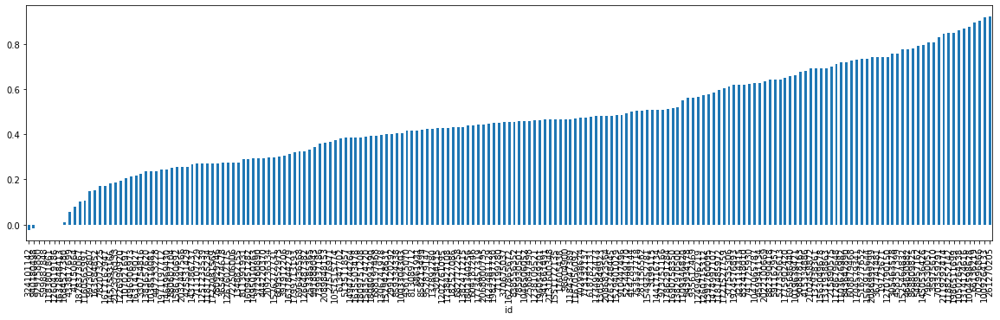

In [34]:
df_more_than_2_v.groupby('id').mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))
plt.show()

In [35]:
# 2 projecgs have negative compound scores 
# id 324101142 and 940180498
df_more_than_2_v.groupby(['id']).mean().sort_values("compound")

,backers_count,converted_pledged_amount,fx_rate,goal,pledged,static_usd_rate,usd_pledged,has,progress,compound,neg,neu,pos
id,,,,,,,,,,,,,
324101142,47,320,1.00000,100.0,320.0,1.000000,320.000000,True,3.200000,-0.023150,0.08325,0.778000,0.138750
940180498,408,114748,1.00000,2000.0,114748.0,1.000000,114748.000000,True,57.374000,-0.016915,0.08070,0.827746,0.091592
929758880,39,1063,1.21498,450.0,948.0,1.125495,1066.969203,True,2.106667,0.000000,0.00000,1.000000,0.000000
599887848,96,4102,1.00000,1200.0,4102.0,1.000000,4102.000000,True,3.418333,0.000000,0.00000,1.000000,0.000000
1183801861,10,470,1.00000,200.0,470.0,1.000000,470.000000,True,2.350000,0.000000,0.00000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004598628,127,14006,1.00000,6000.0,14006.0,1.000000,14006.000000,True,2.334333,0.875000,0.00000,0.421000,0.579000
66136219,40,991,1.36795,250.0,637.0,1.534962,977.770686,True,2.548000,0.895500,0.00000,0.455000,0.545000
702996866,18,620,1.00000,250.0,620.0,1.000000,620.000000,True,2.480000,0.902750,0.00000,0.820500,0.179500


## Those projects comments whose project des score negative compound scores 

In [36]:
# Those projects comments to which the project des score negative compound scores 
df_comment[df_comment.id.isin(blurb_neg)]

,Title,id
61,"Brent @Creators - Hey neighbours, Im over in B...",1786261910
62,Congratulations Emma & Duncan! It's been so m...,1786261910
63,Congratulations so glad you passed your goal. ...,1786261910
64,So happy that you are fully funded and can pro...,1786261910
65,Do you have a link to the backer kit? We just...,1786261910
...,...,...
25153,"No apology needed. Life happens, I hope you ca...",1272012794
25154,I am very happy to read your update tonight! ...,1272012794
25155,Jeff done said it better than I could. Do what...,1272012794
25156,Are you planning on going to BM this year to t...,1272012794


## art,illustration

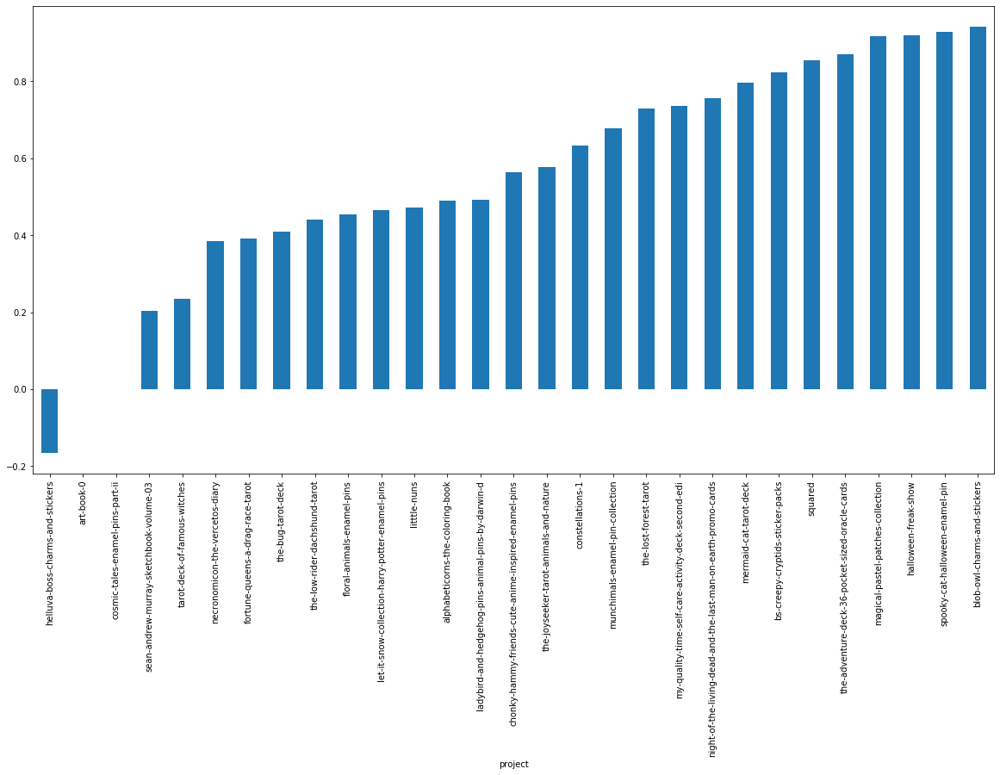

In [279]:
df_comment_v[df_comment_v['category'] == 'art,illustration'].groupby('project').mean()['compound'].sort_values().plot.bar(figsize = (20,10))
# plt.show()
plt.savefig('art_illustration_compound.jpg',bbox_inches='tight')

In [272]:
df_comment_v[df_comment_v['category'] == 'art,illustration'].groupby('Name').mean()

,id,compound,neg,neu,pos
Name,,,,,
AbdulAziz Al-Kaboor,1.167056e+09,0.66880,0.0000,0.0000,1.0000
Abigail Lynn,5.162777e+08,0.95820,0.0000,0.3450,0.6550
Adam Shapiro,1.583575e+09,0.43310,0.0000,0.7980,0.2020
Adam Skava,1.392760e+09,-0.37360,0.0590,0.9410,0.0000
Akashi Ikehara,5.135119e+08,0.79640,0.0000,0.4960,0.5040
...,...,...,...,...,...
roy cowing,7.288721e+08,0.54350,0.0250,0.8310,0.1440
ryder906,1.167056e+09,0.62925,0.0000,0.4295,0.5705
shane,5.135119e+08,-0.12454,0.1672,0.6744,0.1584


In [273]:
df_comment_v[df_comment_v['category'] == 'art,illustration'].groupby('id').mean()

,compound,neg,neu,pos
id,,,,
220055552,0.855000,0.000000,0.644000,0.356000
305463578,0.755150,0.025000,0.772000,0.203000
370675037,0.452800,0.000000,0.735000,0.265000
487908264,0.919800,0.025500,0.791000,0.183500
513511857,0.383842,0.054469,0.749672,0.195859
...,...,...,...,...
1583574720,0.390476,0.038745,0.773118,0.188216
1602130780,0.000000,0.000000,1.000000,0.000000
1704579341,0.729300,0.013040,0.737280,0.249720


# NLP

In [16]:
from nltk.corpus import stopwords
stop_list = stopwords.words('english')

def ngram(df,ngram):
    words = [nltk.tokenize.word_tokenize(x) for x in df]
    words_flatten = nltk.flatten(words)
    lowercase = [w.lower() for w in words_flatten]
    stopremoved = [w for w in lowercase if w not in stop_list]
    removedpunc = [w for w in stopremoved if re.search('^[a-z]+$',w)]
    fdist = nltk.FreqDist(removedpunc)
    if ngram == 'unigram':
        return fdist
    elif ngram == 'bigram':
        bgs = nltk.bigrams(removedpunc)
        fdistbgs = nltk.FreqDist(bgs)
        return fdistbgs.most_common(200)
    elif ngram =='trigram':
        tgs = nltk.trigrams(removedpunc)
        fdisttgs = nltk.FreqDist(tgs)
        return fdisttgs.most_common(200)
    
def createWordcloud(freqdict,ngram):
    plt.figure(figsize=(20,10))

    if ngram != 'unigram':
        ngram_list = [" ".join(p[0]) for p in freqdict]
        cnt_list = [p[1] for p in freqdict]
        freqdict = dict(zip(ngram_list, cnt_list))
#         print(freqdict)
        
    wordcloud = WordCloud(width=800,height=400,background_color='white')
    # generate the word cloud
    wordcloud.generate_from_frequencies(freqdict)
    #plot
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
#     plt.show()
    plt.savefig('wordcloud.jpg')

#     print('------Unigram-------')
#     print(fdist.most_common(20))
#     bgs = nltk.bigrams(removedpunc)
#     fdistbgs = nltk.FreqDist(bgs)
#     print('------Bigram-------')
#     print(fdistbgs.most_common(20))
#     tgs = nltk.trigrams(removedpunc)
#     fdisttgs = nltk.FreqDist(tgs)
#     print('------Trigram-------')
#     print(fdisttgs.most_common(20))

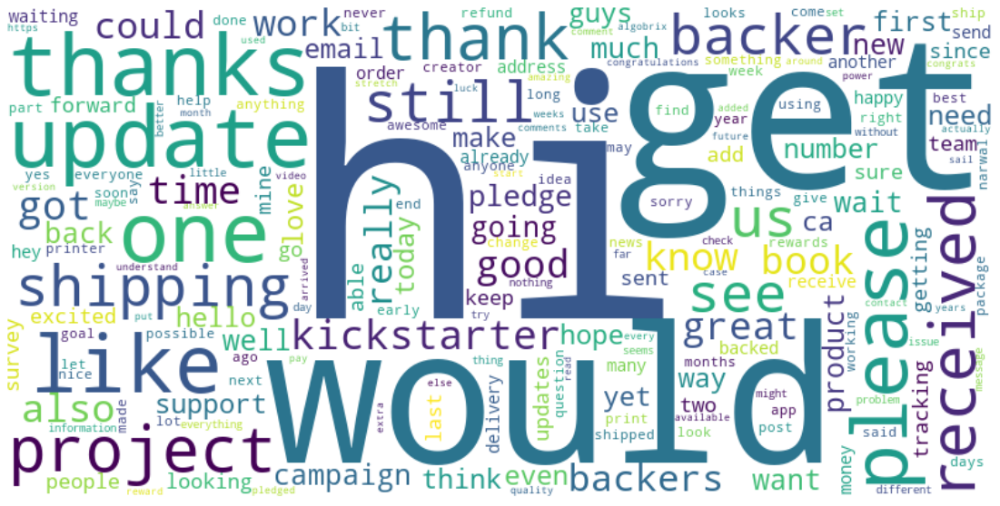

In [126]:
unigram = ngram(df_comment['Title'],'unigram')
# print(type(unigram))
createWordcloud(unigram,'unigram')


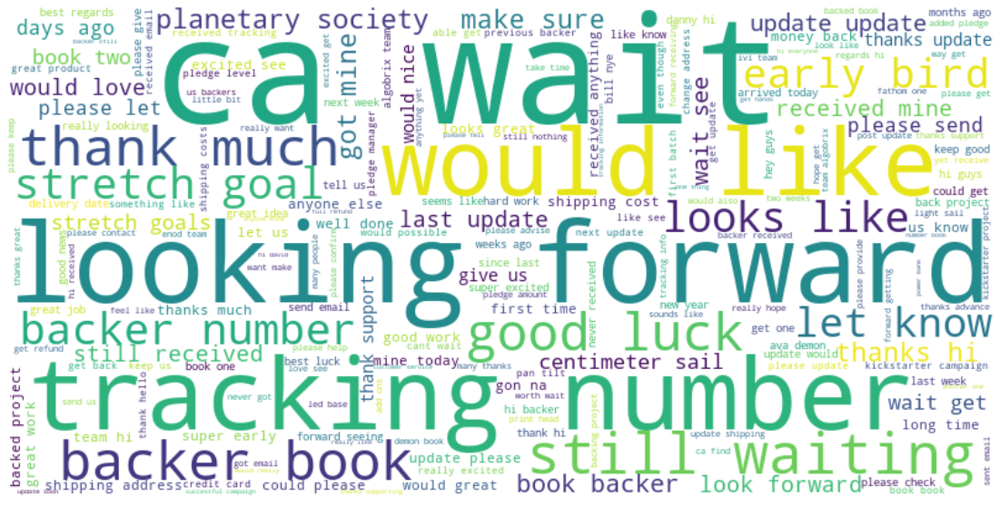

In [32]:
bigram = ngram(df_comment['Title'],'bigram')
# print(bigram[:10])
createWordcloud(bigram,'bigram')

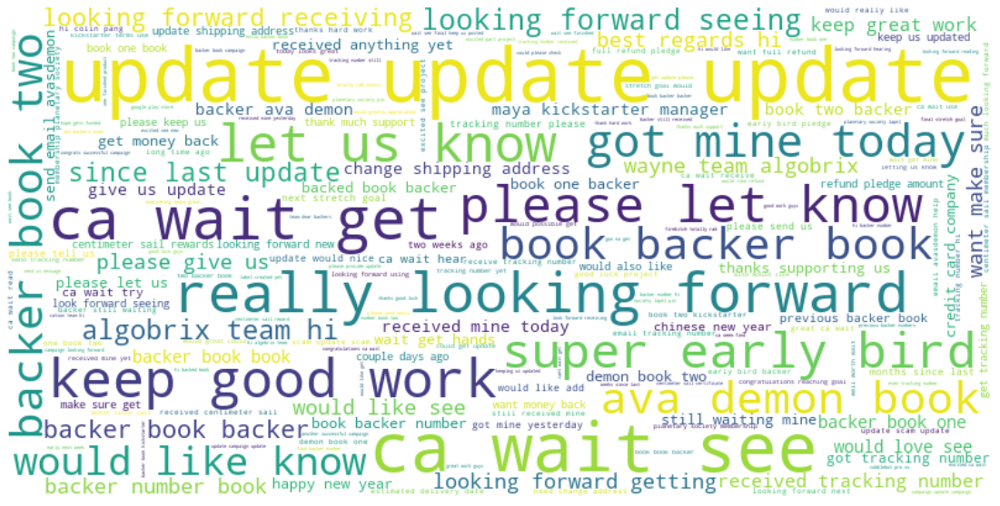

In [133]:
trigram = ngram(df_comment['Title'],'trigram')
createWordcloud(trigram,'trigram')

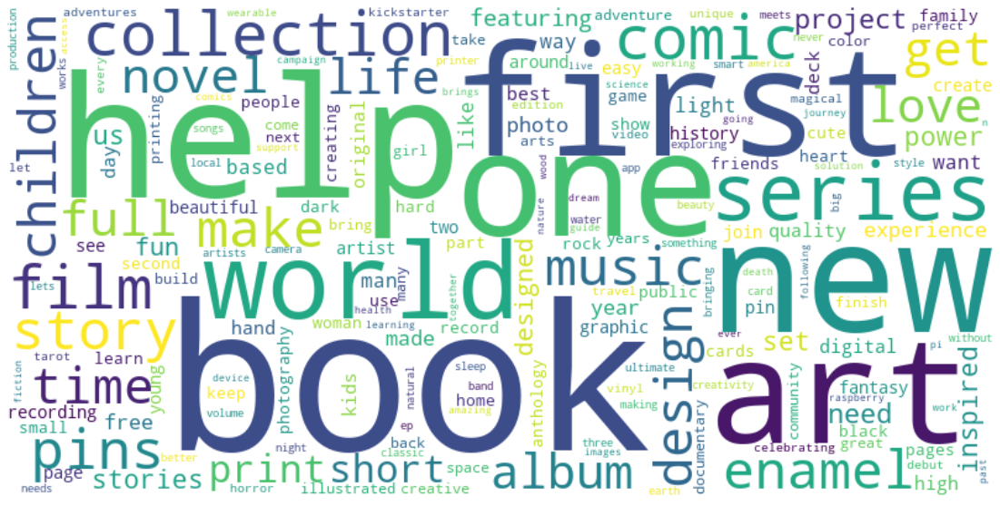

In [69]:
unigram = ngram(df_blurb['blurb'],'unigram')

createWordcloud(unigram,'unigram')

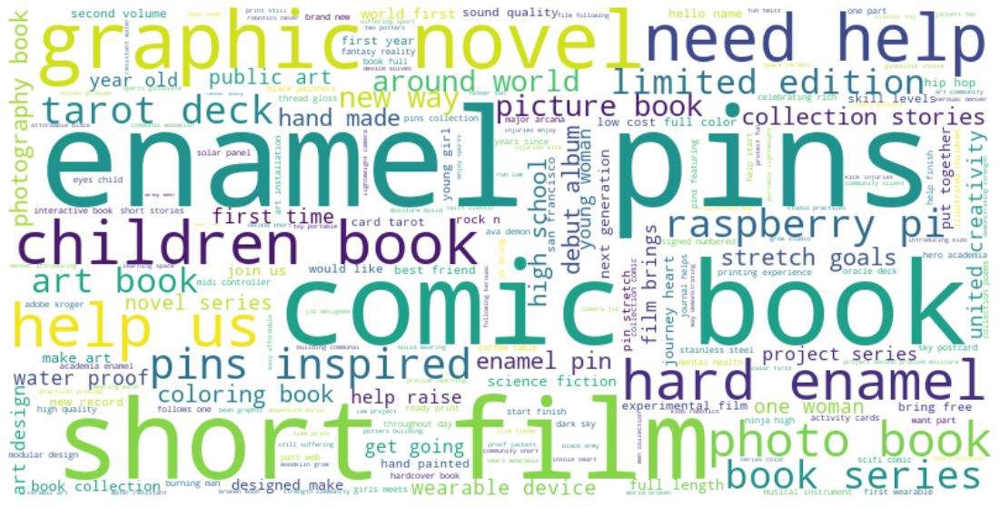

In [33]:
unigram = ngram(df_blurb['blurb'],'bigram')

createWordcloud(unigram,'bigram')

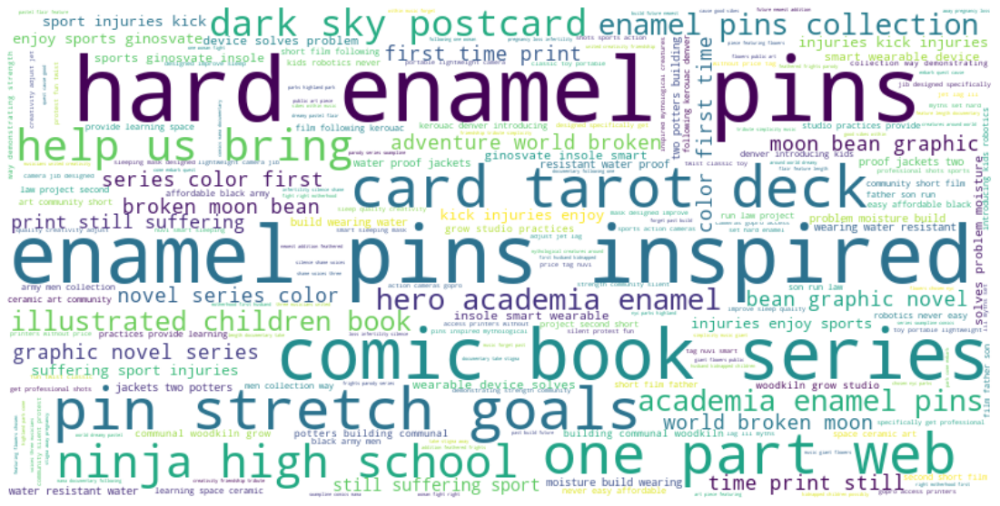

In [34]:
unigram = ngram(df_blurb['blurb'],'trigram')

createWordcloud(unigram,'trigram')

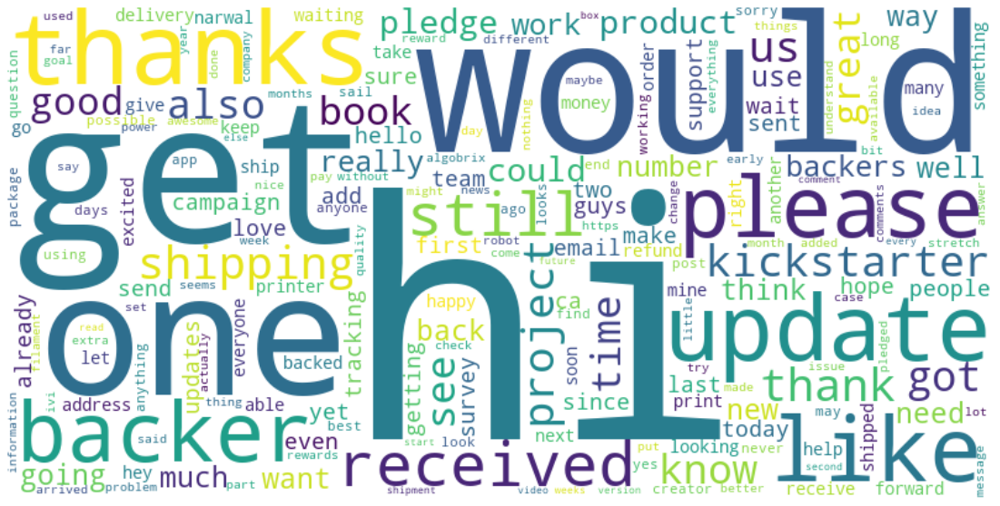

In [134]:
# for exceptional project comments 
unigram = ngram(df_more_than_2['Title'],'unigram')

createWordcloud(unigram,'unigram')

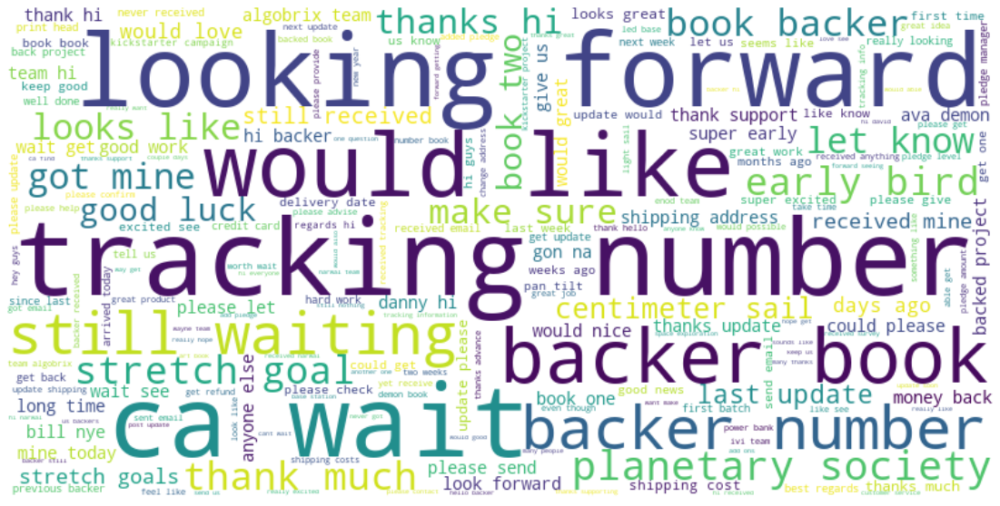

In [46]:
# for exceptional project comments 
unigram = ngram(df_more_than_2['Title'],'bigram')

createWordcloud(unigram,'bigram')

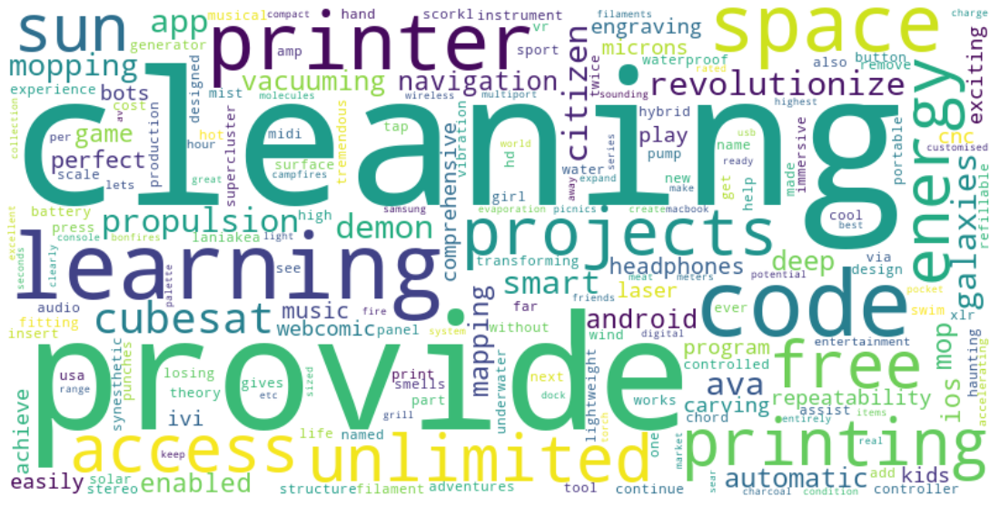

In [71]:
# for exceptional project short des 
unigram = ngram(df_more_than_2['blurb'],'unigram')

createWordcloud(unigram,'unigram')

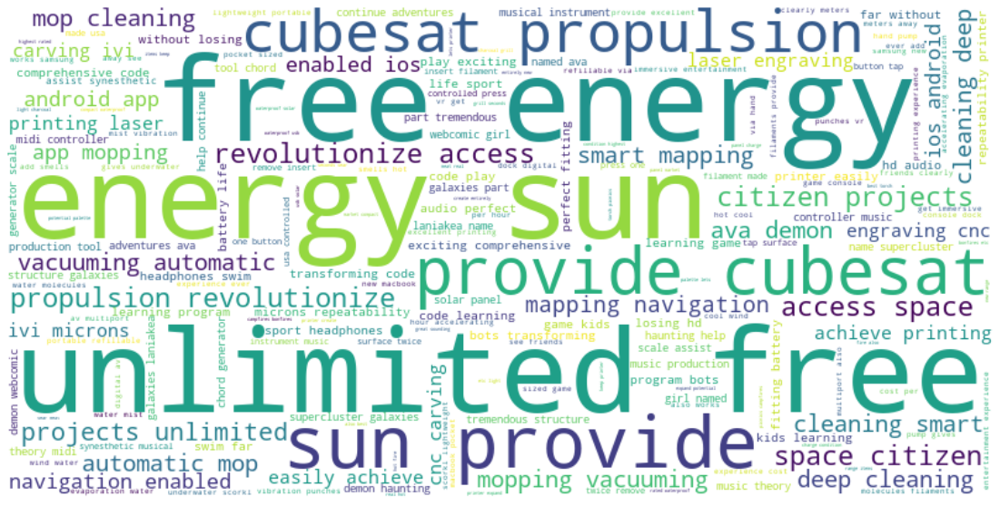

In [45]:
# for exceptional project short des 
unigram = ngram(df_more_than_2['blurb'],'bigram')

createWordcloud(unigram,'bigram')

## By category 

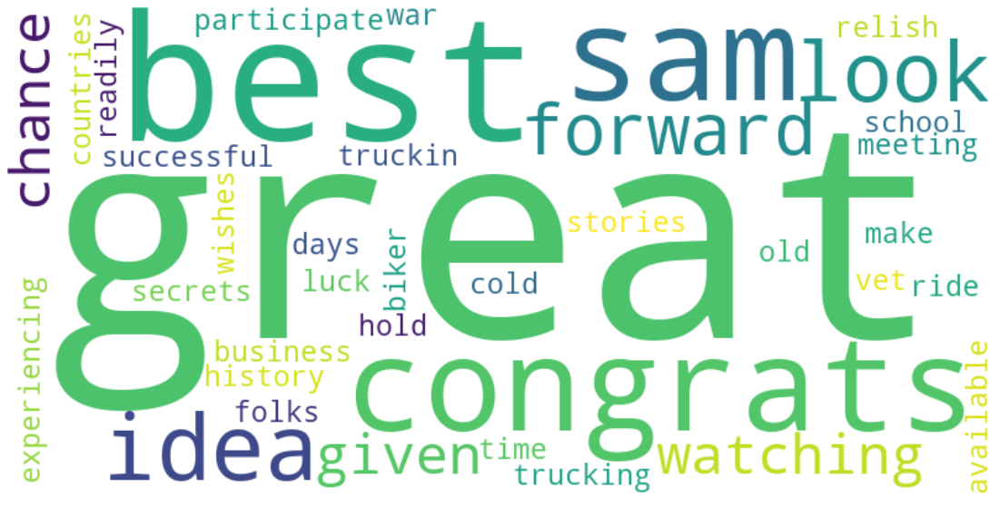

In [235]:
# unigram for film & video,television' category comments
unigram = ngram(df_comment_v[df_comment_v['category']=='film & video,television']['Title'],'unigram')

createWordcloud(unigram,'unigram')

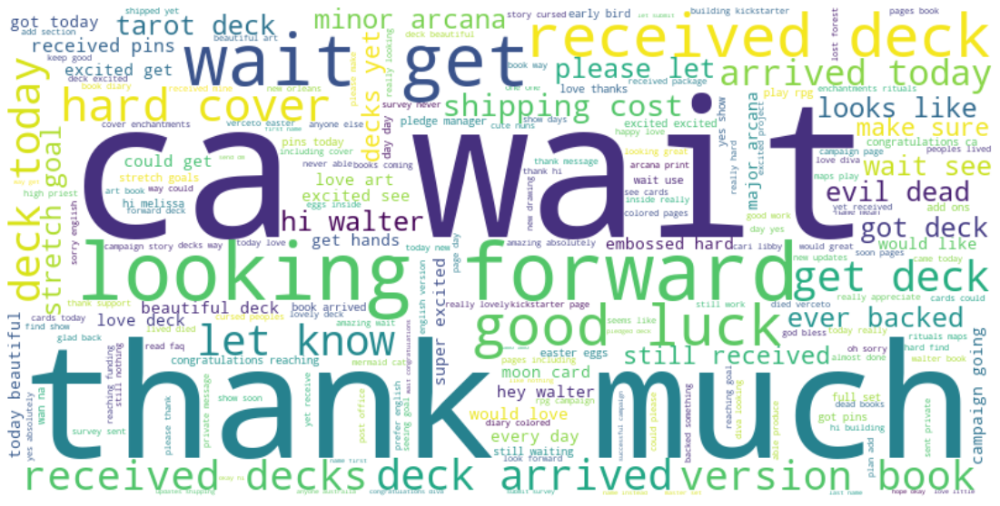

In [40]:
# bigram for 'art,illustration' category comments
unigram = ngram(df_comment_v[df_comment_v['category']=='art,illustration']['Title'],'bigram')

createWordcloud(unigram,'bigram')

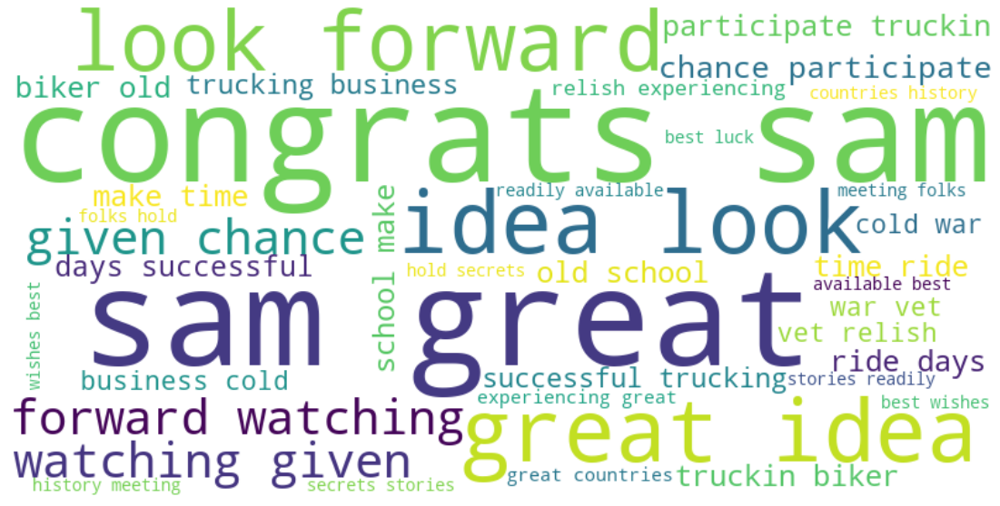

In [39]:
# bigram for film & video,television' category comments
unigram = ngram(df_comment_v[df_comment_v['category']=='film & video,television']['Title'],'bigram')

createWordcloud(unigram,'bigram')

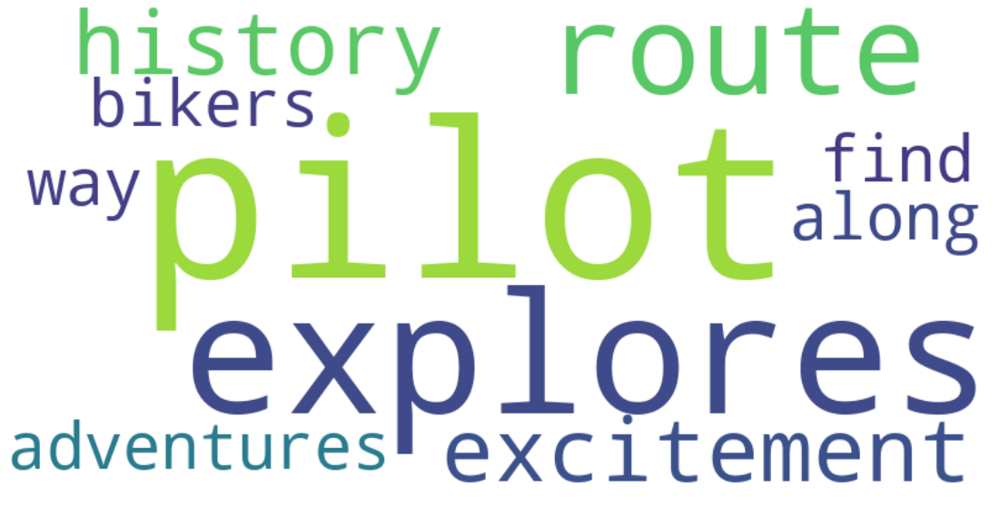

In [238]:
# unigram for film & video,television' category blurb
unigram = ngram(df_blurb_v[df_blurb_v['category']=='film & video,television']['blurb'],'unigram')

createWordcloud(unigram,'unigram')

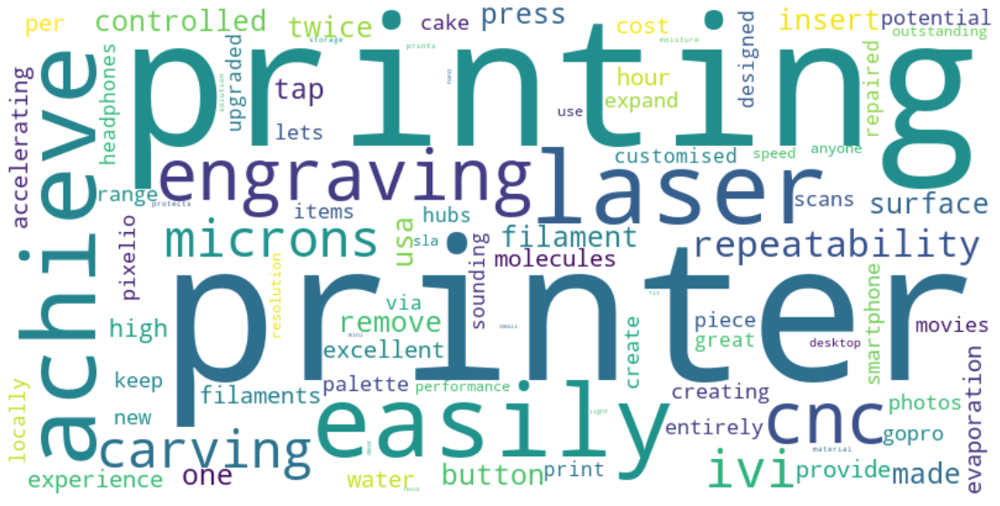

In [243]:
# unigram for 'technology,3d printing' category blurb
# unigram = ngram(df_comment_v[df_comment_v['category']=='technology,3d printing']['Title'],'unigram')
unigram = ngram(df_en[df_en['category']=='technology,3d printing']['blurb'],'unigram')

createWordcloud(unigram,'unigram')


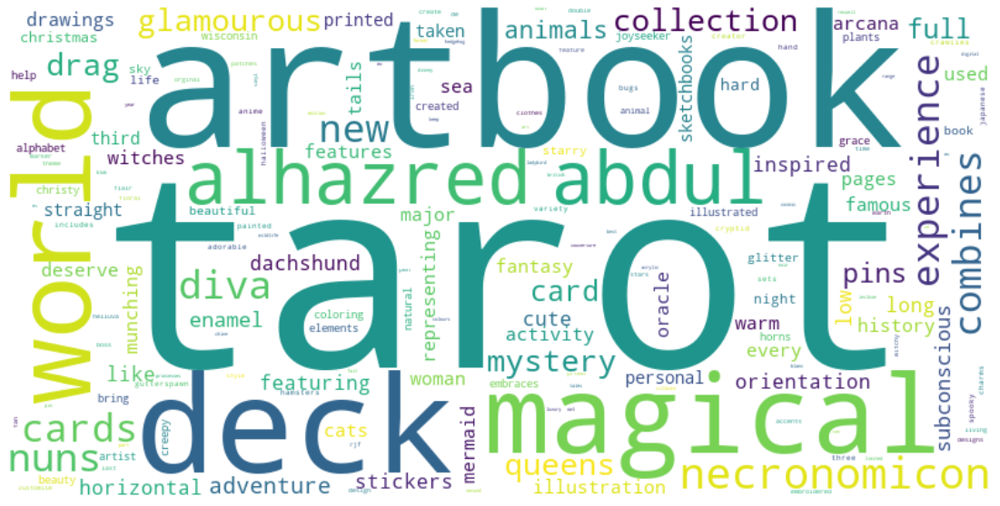

In [247]:
# unigram for 'art,illustration' category blurb
unigram = ngram(df_en[df_en['category']=='art,illustration']['blurb'],'unigram')

createWordcloud(unigram,'unigram')


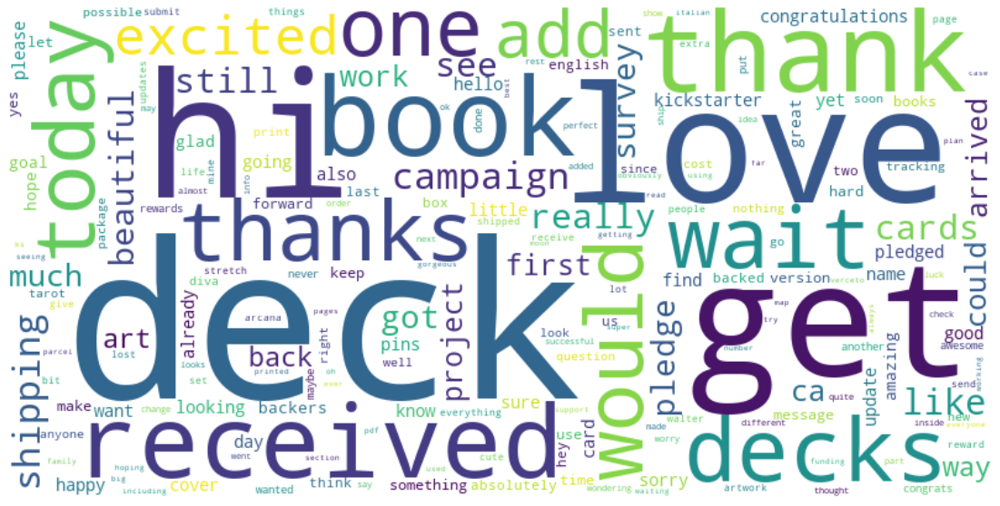

In [248]:
# unigram for 'art,illustration' category comment
unigram = ngram(df_en[df_en['category']=='art,illustration']['Title'],'unigram')

createWordcloud(unigram,'unigram')

## proejct with negative compound score for vader

In [ ]:
df_blurb_v_neg_compound

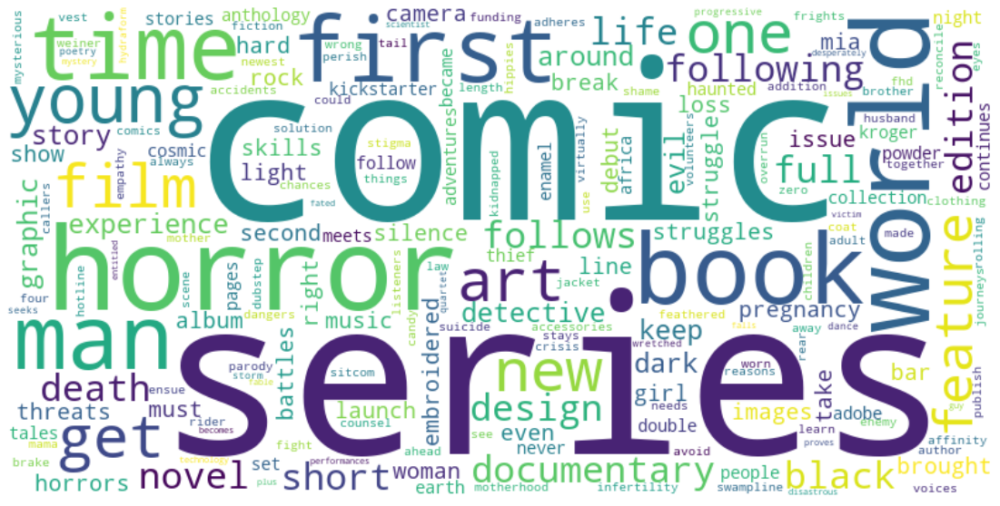

In [17]:
df_blurb_v_neg_compound
unigram = ngram(df_blurb_v_neg_compound['blurb'],'unigram')

createWordcloud(unigram,'unigram')

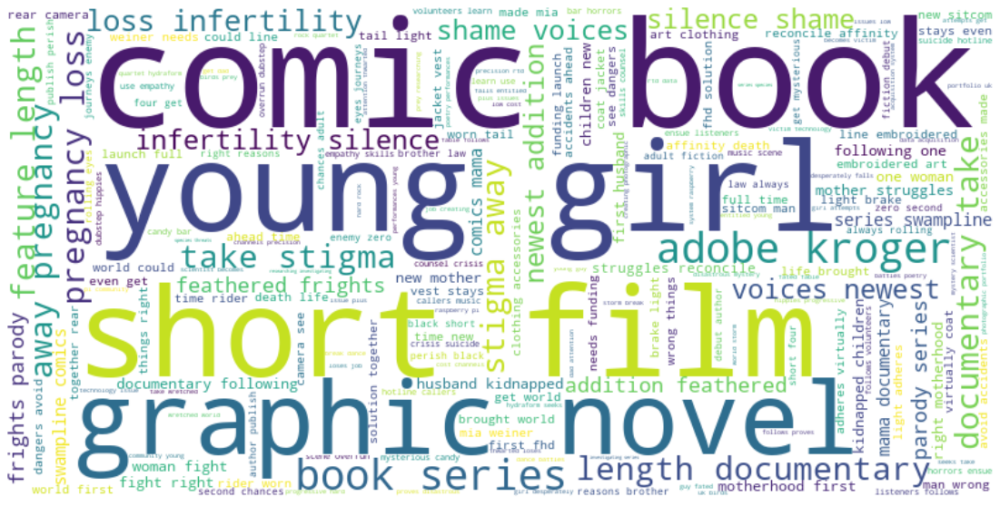

In [21]:
unigram = ngram(df_blurb_v_neg_compound['blurb'],'bigram')

createWordcloud(unigram,'bigram')

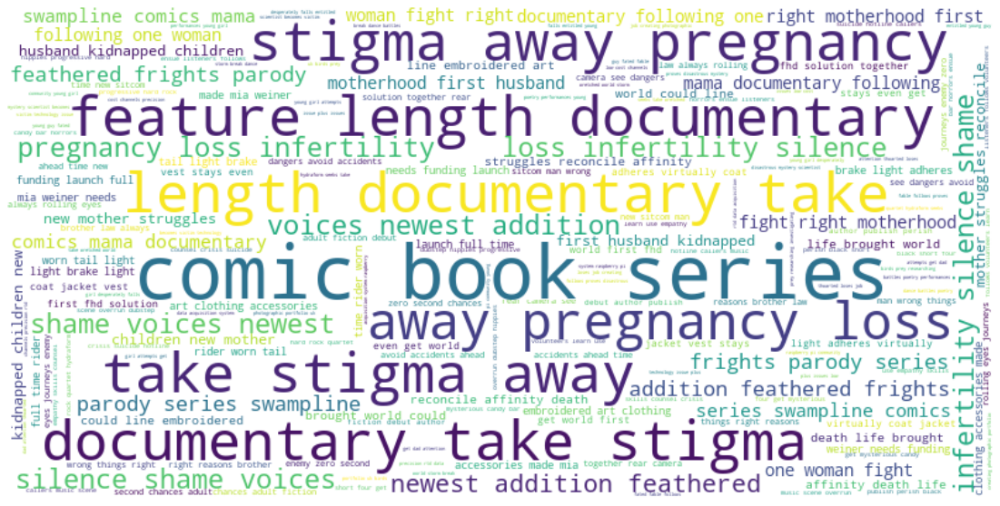

In [22]:
unigram = ngram(df_blurb_v_neg_compound['blurb'],'trigram')

createWordcloud(unigram,'trigram')

In [18]:
df_blurb_v_neg_compound

,blurb,id,category,compound,neg,neu,pos
11,A feature length documentary that will take th...,1828684003,"film & video,documentary",-0.6900,0.231,0.769,0.000
15,The newest addition to the Feathered Frights ...,1420593141,"comics,comic books",-0.2732,0.160,0.840,0.000
16,‘MAMA’ is a documentary following one woman’s ...,1905219398,"film & video,documentary",-0.3818,0.120,0.880,0.000
36,A new mother struggles to reconcile her affini...,1383157764,"film & video,drama",-0.7506,0.286,0.714,0.000
43,"HOW COULD YOU?: a line of embroidered art, clo...",1187875197,"art,textiles",-0.3595,0.106,0.894,0.000
...,...,...,...,...,...,...,...
556,Art and stars? Art and rock faults? Art and ti...,695686440,"publishing,art books",-0.3883,0.169,0.732,0.099
573,A mini horror scifi comic following the advent...,1145281366,"comics,comic books",-0.3802,0.217,0.652,0.130
578,Donate for Season 6 of the show people say is ...,175749769,"film & video,webseries",-0.4840,0.125,0.875,0.000
584,A graphic nonfiction history of women-led move...,1227010510,"comics,graphic novels",-0.3182,0.103,0.897,0.000


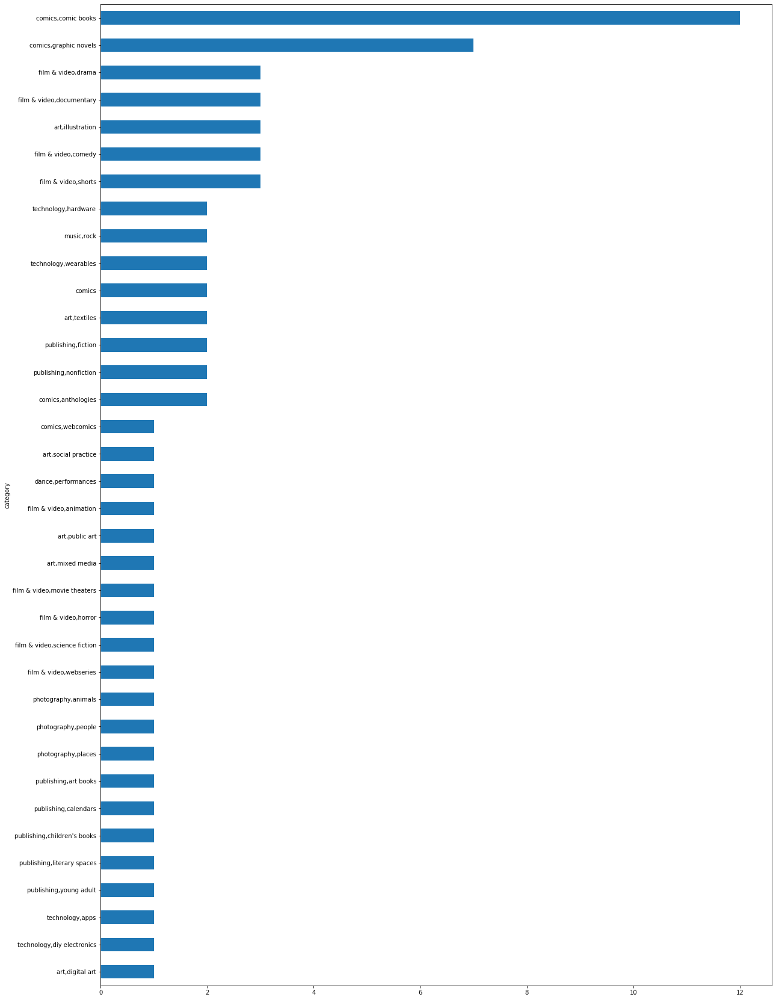

In [23]:
# for projects with negative vader compound score what are their categories 
df_blurb_v_neg_compound.groupby(['category']).size().sort_values(ascending=True).plot.barh(figsize = (20,30))
plt.show()

# SenticNet
1. return a sentiment score at the word level 
2. create aggregation function to estimate the overall sent of a sentence 
3. get_words_bag lemmatise the words 
4. get/pk,._a]ve_polarity return the sum of the score at words level / number of words that have score 

In [28]:
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import EnglishStemmer
import re
from senticnet.senticnet import SenticNet

def get_words_bag(message):
    wnl = WordNetLemmatizer()
    es = EnglishStemmer()
    for word in re.finditer("\w+", message):
        yield (wnl.lemmatize(word.group()), es.stem(word.group()))

def get_avg_polarity(message):
#     threshold = 0.3
    sn = SenticNet()
    count = 0
    summ = 0
    for word_options in get_words_bag(message):
        polarity = 0
        print(word_options)
        for word in word_options:
            try:
                print(sn.concept(word))
                concept = sn.concept(word)
                polarity = float(concept['polarity_value'])
                break
            except:
                pass #Do next
#         if abs(polarity) > threshold:
        summ += polarity
        count += 1

    if count == 0:
        return 0 
    return summ / count


In [73]:
df_comment_s = df_comment.copy()
df_comment_s['senticnet'] = df_comment['Title'].apply(lambda x: get_avg_polarity(x))
df_comment_s

,Title,id,senticnet
1,"I backed at the early bird hard cover, but is ...",412975852,0.160500
2,this is so great I want it so much!,412975852,0.095222
3,looking forward to this - keep us updated in K...,412975852,0.079000
4,Glad to see this campaign come to fruition. I ...,412975852,0.110659
5,Congrats on hitting the goal! So keen to final...,412975852,0.178800
...,...,...,...
25153,"No apology needed. Life happens, I hope you ca...",1272012794,0.119333
25154,I am very happy to read your update tonight! ...,1272012794,0.115320
25155,Jeff done said it better than I could. Do what...,1272012794,0.012067
25156,Are you planning on going to BM this year to t...,1272012794,0.080706


In [74]:
df_blurb_s = df_blurb.copy()
df_blurb_s['senticnet'] = df_blurb['blurb'].apply(lambda x: get_avg_polarity(x))
df_blurb_s

,blurb,id,senticnet
0,Adventure into the World of the Broken Moon wi...,412975852,0.054227
1,Are you still suffering sport injuries? Just...,182527086,0.033875
2,Dry-active is a smart wearable device that sol...,901566235,0.088545
3,"Two potters building a communal woodkiln, to g...",1786261910,0.202333
4,A short film about a father and son on the run...,1777707042,0.049577
...,...,...,...
584,A graphic nonfiction history of women-led move...,1227010510,-0.012682
585,Reboot a classic Bridgestone X0-1 replica trib...,309561756,0.045750
586,"Set in 15th century West Africa, follow the ex...",1553989685,-0.074739
587,Learn Chinese the FUN way with this interactiv...,1382970500,0.222538


In [75]:
# group by project id
df_comment_s_sorted = df_comment_s.groupby(['id']).mean().reset_index().sort_values(by=['senticnet'],ascending =False)
df_blurb_s_sorted = df_blurb_s.sort_values(by=['senticnet'],ascending =False)


In [76]:
df_comment_s_sorted

,id,senticnet
385,1369945048,0.590200
364,1291780086,0.532500
291,1012016276,0.526000
580,2113117951,0.498571
37,134624162,0.456000
...,...,...
124,445616244,-0.073242
404,1427985529,-0.077143
570,2088443769,-0.086267
557,2028971269,-0.181429


In [77]:
df_blurb_s_sorted

,blurb,id,senticnet
542,Making specialized 3D printing easier and chea...,759270708,0.490286
520,Customized space | Vertical opening | Advanced...,739937186,0.478875
310,Diva's nuns artbook,1167056092,0.455750
495,Fan designs of Helluva Boss stars as adorable ...,1078634931,0.444333
411,"Titanium, Brass & Copper Mini Click Pens by Bi...",1627865672,0.443400
...,...,...,...
478,"Mia Raven, the thief who became a detective wh...",1109346820,-0.119120
557,100% Natural Vegan Eyebrow Gel that Colours an...,1986951149,-0.132778
468,The NoPhone ZERO is a plastic rectangle that r...,1549352781,-0.146750
419,Limited Edition Charity Pin,343202538,-0.202500


In [78]:
# see those with comments sentiment scores < 0 
df_comment_s[df_comment_s['senticnet'] < 0 ]

,Title,id,senticnet
22,Quite pissed off that one 1 of my shoe became ...,182527086,-0.045600
34,No deivery no tracking? Im lost here @creator ...,182527086,-0.035000
38,I had the same issue with the gel after my 13 ...,182527086,-0.077188
88,I would like the tracking number for my produc...,780929746,-0.039412
92,It says my package was delivered on May 15th. ...,780929746,-0.048333
...,...,...,...
25048,Still nothing here in US. Was there tracking i...,696436568,-0.077692
25055,Still nothing here in Argentina... Should I st...,696436568,-0.050000
25056,Follow-up to my post from April 24th: I receiv...,696436568,-0.039590
25064,Still waiting!!,696436568,-0.085000


In [92]:
# the most positive comment
# df_comment_s.sort_values(by='senticnet',ascending = False)
temp = df_comment_s.groupby(['id']).mean().sort_values("senticnet",ascending = False)
temp

,senticnet
id,
1369945048,0.590200
1291780086,0.532500
1012016276,0.526000
2113117951,0.498571
134624162,0.456000
...,...
445616244,-0.073242
1427985529,-0.077143
2088443769,-0.086267


In [96]:
# Project with the highest score from senticnet 
df[df['id']==1369945048]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
2206,Nicely presented Kickstarter - Good Luck!,jerice50,NaN,1571201023/the-art-of-screen-printing/comments...,almost 6 years ago,the-art-of-screen-printing,the art of screen printing,2,Keeping the hands on silk screening arts alive...,"{""id"":351,""name"":""Printing"",""slug"":""crafts/pri...",...,The Art of Screen Printing,130.0,"{""id"":1880932,""project_id"":1880932,""state"":""in...",the-art-of-screen-printing,failed,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",130.0,True,en
2207,@ jerice50: Thank you very much.,Keelan Babinski,Creator,1571201023/the-art-of-screen-printing/comments...,almost 6 years ago,the-art-of-screen-printing,the art of screen printing,2,Keeping the hands on silk screening arts alive...,"{""id"":351,""name"":""Printing"",""slug"":""crafts/pri...",...,The Art of Screen Printing,130.0,"{""id"":1880932,""project_id"":1880932,""state"":""in...",the-art-of-screen-printing,failed,1.0,"{""web"":{""project"":""https://www.kickstarter.com...",130.0,True,hr


In [112]:
lowest_s = df_comment_s.groupby(['id']).mean().sort_values("senticnet",ascending = True)
lowest_s

,senticnet
id,
1995828109,-0.213333
2028971269,-0.181429
2088443769,-0.086267
1427985529,-0.077143
445616244,-0.073242
666540432,-0.056708
41150664,-0.052545
599887848,-0.049061
1183801861,-0.025611


In [121]:
df[df['id'] ==1995828109]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,converted_pledged_amount,country,country_displayable_name,currency,current_currency,fx_rate,goal,id,location,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,language
7531,Congratulations on funding!,James Cameron,NaN,lways2/always-2-the-art-of-hadrion-and-elliot/comments?comment=Q29tbWVudC0zMDQ0NzM1Ng%3D%3D,5 months ago,always-2-the-art-of-hadrion-and-elliot,always 2 the art of hadrion and elliot,57,"Always 2 showcases artwork from Hadrion The Butcher, selected Hadrion & Elliot stories and images from the upcoming webcomic.","{""id"":249,""name"":""Anthologies"",""slug"":""comics/anthologies"",""position"":1,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/anthologies""}}}",4336,US,the United States,USD,USD,1.0,3500.0,1995828109,"{""id"":2488916,""name"":""Santa Rosa"",""slug"":""santa-rosa-ca"",""short_name"":""Santa Rosa, CA"",""displayable_name"":""Santa Rosa, CA"",""localized_name"":""Santa Rosa"",""country"":""US"",""state"":""CA"",""type"":""Town"",""is_root"":false,""expanded_country"":""United States"",""urls"":{""web"":{""discover"":""https://www.kickstarter.com/discover/places/santa-rosa-ca"",""location"":""https://www.kickstarter.com/locations/santa-rosa-ca""},""api"":{""nearby_projects"":""https://api.kickstarter.com/v1/discover?signature=1610680412.ad858bb05771fa6f065f97b78de379636ed67687&woe_id=2488916""}}}",Always 2: The Art of Hadrion & Elliot,4336.0,"{""id"":4079438,""project_id"":4079438,""state"":""inactive"",""state_changed_at"":1601299446,""name"":null,""blurb"":null,""background_color"":null,""text_color"":null,""link_background_color"":null,""link_text_color"":null,""link_text"":null,""link_url"":null,""show_feature_image"":false,""background_image_opacity"":0.8,""should_show_feature_image_section"":true,""feature_image_attributes"":{""image_urls"":{""default"":""https://ksr-ugc.imgix.net/assets/030/994/030/3e136663c4817af0298e5c4cc8da5ff2_original.jpeg?ixlib=rb-2.1.0&crop=faces&w=1552&h=873&fit=crop&v=1602633029&auto=format&frame=1&q=92&s=2ae921a49f7b216e4c0a2084cea5bde8"",""baseball_card"":""https://ksr-ugc.imgix.net/assets/030/994/030/3e136663c4817af0298e5c4cc8da5ff2_original.jpeg?ixlib=rb-2.1.0&crop=faces&w=560&h=315&fit=crop&v=1602633029&auto=format&frame=1&q=92&s=1b76e873799bb81e5e2f881797067dcf""}}}",always-2-the-art-of-hadrion-and-elliot,successful,1.0,"{""web"":{""project"":""https://www.kickstarter.com/projects/always2/always-2-the-art-of-hadrion-and-elliot?ref=discovery_category_newest"",""rewards"":""https://www.kickstarter.com/projects/always2/always-2-the-art-of-hadrion-and-elliot/rewards""}}",4336.0,True,en


## Plot the overall senticnet scores over projects

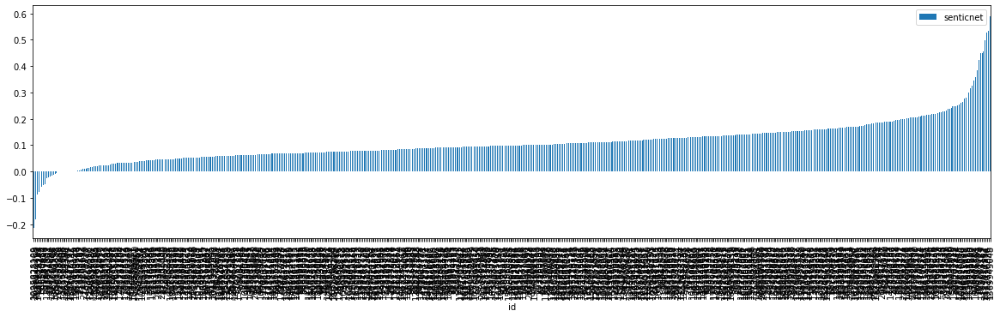

In [85]:

df_comment_s.groupby(['id']).mean().sort_values("senticnet").plot.bar(figsize = (20,5))
# plt.show()
plt.savefig('comment_s.jpg')

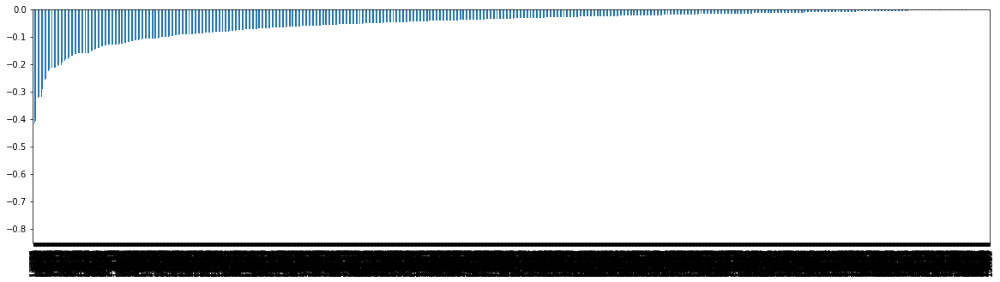

In [80]:
df_comment_s[df_comment_s['senticnet'] < 0]['senticnet'].sort_values().plot.bar(figsize = (20,5))
plt.show()

In [166]:
df[df['id']== 134624162]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,location,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has
21075,Great work!,Scott Mitchell Rosenberg/PlatinumStudios,NaN,newsmith/undad-comic-miniseries-season-2/comme...,almost 6 years ago,undad-comic-miniseries-season-2,undad comic miniseries season 2,62,Collecting issues #5-8 of the Undad miniseries...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":1100968,""name"":""Canberra"",""slug"":""canber...",Undad comic - Season 2,3860.0,"{""id"":1752707,""project_id"":1752707,""state"":""ac...",undad-comic-miniseries-season-2,successful,0.767936,"{""web"":{""project"":""https://www.kickstarter.com...",2964.232613,True
21076,SO CLOSE!,Stuart Hodge,NaN,newsmith/undad-comic-miniseries-season-2/comme...,almost 6 years ago,undad-comic-miniseries-season-2,undad comic miniseries season 2,62,Collecting issues #5-8 of the Undad miniseries...,"{""id"":252,""name"":""Graphic Novels"",""slug"":""comi...",...,"{""id"":1100968,""name"":""Canberra"",""slug"":""canber...",Undad comic - Season 2,3860.0,"{""id"":1752707,""project_id"":1752707,""state"":""ac...",undad-comic-miniseries-season-2,successful,0.767936,"{""web"":{""project"":""https://www.kickstarter.com...",2964.232613,True


# Category 

In [6]:
def extract_cat(text):
    text = text.split(",")
    
    text = text[2]
    text = text.replace ("/", ",")

    
    text = text.replace ("name", "")
    text = text.replace ("slug", "")
    
    text = text.replace ('"', "")
    text = text.replace ('{', "")
    text = text.replace (':', "")
    
    text = text.lower()
    text = re.sub(r"\'\n", " ", text)
    text = re.sub(r"\'\xa0", " ", text)
    text = re.sub('\s+', ' ', text) # matches all whitespace characters
    text = text.strip(' ')
    
    text = text.split(",")
    if len(text)== 3:
        return text[0] + ',' + text[1]
    elif len(text) == 2:
        return text[0] + ',' + text[1]
    elif len(text) == 1:
        return text[0]
    return ''



df['category'] = df['category'].apply(lambda x: extract_cat(x))


In [178]:
df.category.unique()

array(['comics,graphic novels', 'technology,wearables', 'art,ceramics',
       'film & video,drama', 'technology,robots', 'art,sculpture',
       'technology,camera equipment', 'technology,3d printing',
       'art,mixed media', 'film & video,documentary', 'music,jazz',
       'art,public art', 'music,indie rock', 'comics,comic books',
       'publishing,zines', 'technology,hardware', 'art,installations',
       'publishing,fiction', 'art,painting', 'technology,gadgets',
       'photography', 'art,illustration', 'film & video,experimental',
       'music,world music', 'technology,software',
       'publishing,nonfiction', 'technology,apps', 'music,kids',
       'music,rock', 'comics,webcomics', 'art,textiles',
       "publishing,children's books", 'dance,performances',
       'crafts,printing', 'crafts,diy', 'publishing,poetry',
       'technology,diy electronics', 'publishing,academic',
       'photography,photobooks', 'music,faith',
       'film & video,science fiction', 'film & vide

# random

In [369]:
analyzer = SentimentIntensityAnalyzer()
print(analyzer.polarity_scores('VADER is VERY SMART, handsome, and FUNNY.'))
print(analyzer.polarity_scores('VADER is very smart, handsome, and funny.'))
print(analyzer.polarity_scores('The food is BAD'))
print(analyzer.polarity_scores('The food is bad'))
print(analyzer.polarity_scores('Si que triste creer en un proyecto mexicano y darse cuenta que no fue m√°s que el m√°s t√≠pico mexicanismo de quedar mal. Por eso nos ven como nos ven al exterior y que mal que esta plataforma les de dinero sin que den nada de lo que prometieron, finalmente se quedan su tajada y lo dem√°s no les importa. No deber√≠an darles dinero hasta no recibir feedback positivo de al menos un cierto porcentaje de los que depositamos la fe en equipos fraudulentos como este '))

{'neg': 0.0, 'neu': 0.246, 'pos': 0.754, 'compound': 0.9227}
{'neg': 0.0, 'neu': 0.299, 'pos': 0.701, 'compound': 0.8545}
{'neg': 0.585, 'neu': 0.415, 'pos': 0.0, 'compound': -0.6408}
{'neg': 0.538, 'neu': 0.462, 'pos': 0.0, 'compound': -0.5423}
{'neg': 0.133, 'neu': 0.867, 'pos': 0.0, 'compound': -0.886}


In [63]:
print(get_avg_polarity("I don't like it"))
print(get_avg_polarity("like"))

print(get_avg_polarity("I don't love it"))
print(get_avg_polarity('I love it'))
print(get_avg_polarity('It is impressive!'))
print(get_avg_polarity('When can I get a refund?'))

0.0
0.0
0.16599999999999998
0.27666666666666667
0.083
-0.005


In [31]:
get_avg_polarity('You look amazing')

('You', 'you')
('look', 'look')
('amazing', 'amaz')
{'polarity_label': 'positive', 'polarity_value': '0.956', 'sentics': {'introspection': '1.0', 'temper': '0', 'attitude': '0', 'sensitivity': '0.912'}, 'moodtags': ['#joy', '#eagerness'], 'semantics': ['astounded', 'astonished', 'astound', 'surprise', 'amazed']}


0.31866666666666665

In [194]:
analyzer = SentimentIntensityAnalyzer()
print(analyzer.polarity_scores("YAY"))
print(analyzer.polarity_scores("yay"))

{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5267}
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5267}


In [195]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

analyzer = SentimentIntensityAnalyzer()
sentiment1 = analyzer.polarity_scores("Best regards")
sentiment2 = analyzer.polarity_scores("Hi Williams")
sentiment3 = analyzer.polarity_scores("YAY")


print(sentiment1)
print(sentiment2)
print(sentiment3)

{'neg': 0.0, 'neu': 0.192, 'pos': 0.808, 'compound': 0.6369}
{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
{'neg': 0.0, 'neu': 0.0, 'pos': 1.0, 'compound': 0.5267}


In [323]:
df[df['id'] ==973751166]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,name,pledged,profile,slug,state,static_usd_rate,urls,usd_pledged,has,progress
9556,@Chop+Swipe: Neat idea but I cringed watching ...,Rebecca Novelli,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,4 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9557,Hopefully you will be able to make it 100 per ...,elaine,NaN,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,3 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9558,"Perfect for our kitchen and the ""in laws"" luxu...",Sneaky Prawn Games,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,5 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9559,This is need not a want!! Brilliant design,Holly Crandon,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,5 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9560,"What a great idea, simple, stylish and just pe...",Robert,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,5 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9561,Diseño elegante al servicio de una buena idea....,Jordi Pascual,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,5 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy chopping,422,The 'small but big' chopping board for the org...,"{""id"":28,""name"":""Product Design"",""slug"":""desig...",...,Chop and Swipe: swipe left on messy chopping,13020.0,"{""id"":4085066,""project_id"":4085066,""state"":""ac...",chop-and-swipe-swipe-left-on-messy-chopping,successful,1.302645,"{""web"":{""project"":""https://www.kickstarter.com...",16960.434775,True,2.604
9562,"Hi Joseph, thank you so much your appreciation...",Chop+Swipe,Creator,ndswipe/chop-and-swipe-swipe-left-on-messy-cho...,5 months ago,chop-and-swipe-swipe-left-on-messy-chopping,chop and swipe swipe left on messy ch

In [333]:
df_comment_v[df_comment_v['id'] == 973751166 ].groupby('id').mean()

,compound,neg,neu,pos
id,,,,
973751166,0.483445,0.04075,0.7478,0.2114


In [368]:
df_more_than_2_v[df_more_than_2_v['id'] == 548957162 ]

,Title,Name,Type,Comment_URL,Period,project,project_name,backers_count,blurb,category,...,state,static_usd_rate,urls,usd_pledged,has,progress,compound,neg,neu,pos
24485,"Correo electrónico: donovan_58@hotmail.com, G...",Germán Flores,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,almost 2 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.0000,0.000,1.000,0.000
24477,"Hope to hear back soon. Hola amigos de Tonalli,",Juan Torres,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,over 3 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.4404,0.000,0.734,0.266
24484,Quedaste muy mal a 2 años del quesque proyecto...,Germán Flores,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,almost 2 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.0000,0.000,1.000,0.000
24474,Hey there! Any news you might want to share in...,Markus Jöbstl,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,almost 4 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.7901,0.000,0.619,0.381
24475,"Saludos! Hola, gracias por la actualización, p...",Ramiro,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,almost 4 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.0000,0.000,1.000,0.000
24476,Hola @Ramiro si estimamos que en la primera o ...,Tonalli,Creator,nallisolar/tonalli-home-el-primer-smart-solar-...,almost 4 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,0.5411,0.000,0.885,0.115
24483,"Seguimos sin novedades Tonalli... mal, mal, ma...",Ramiro,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,over 2 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,-0.5574,0.184,0.816,0.000
24478,Me gustaría dieran una actualización del proye...,ROBERTO MARTINEZ CARBONEY,NaN,nallisolar/tonalli-home-el-primer-smart-solar-...,over 3 years ago,tonalli-home-el-primer-smart-solar-system,tonalli home el primer smart solar system,33,Tonalli Home: El primer dispositivo solar todo...,"{""id"":337,""name"":""Gadgets"",""slug"":""technology/...",...,successful,0.048817,"{""web"":{""project"":""https://www.kickstarter.com...",2856.310423,True,2.92555,-0.2960,0.128,0.872,0.000
24482,MAL MAL MAL MUY MAL https://www.linkedin.com/i...,Germán Fl

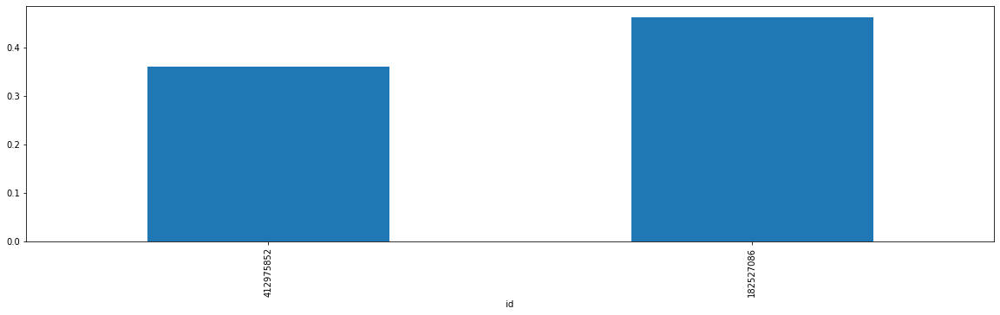

In [344]:
df_comment_v[:10].groupby('id').mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))
# df_more_than_2_v.groupby('id').mean().sort_values("compound")['compound'].plot.bar(figsize = (20,5))


In [342]:
df_comment_v[:10]

,Title,id,compound,neg,neu,pos
0,Thank you. Pledge doubled.,412975852,0.3612,0.000,0.545,0.455
1,"I backed at the early bird hard cover, but is ...",412975852,-0.1306,0.051,0.915,0.034
2,this is so great I want it so much!,412975852,0.7962,0.000,0.497,0.503
3,looking forward to this - keep us updated in K...,412975852,0.0000,0.000,1.000,0.000
4,Glad to see this campaign come to fruition. I ...,412975852,0.2500,0.000,0.956,0.044
5,Congrats on hitting the goal! So keen to final...,412975852,0.9342,0.000,0.498,0.502
6,Thank you :),412975852,0.6705,0.000,0.154,0.846
7,"Hi guys, how are we looking for fulfilment on ...",412975852,0.0000,0.000,1.000,0.000
8,"Ginosvate Team Hi Tomas,",182527086,0.0000,0.000,1.000,0.000
9,"Hello, I signed up for one of the 1 x super ea...",182527086,0.9246,0.000,0.798,0.202


In [25]:
from senticnet.senticnet import SenticNet

def senticnet(msg):
    sn = SenticNet()
    concept_info = sn.concept(msg)
    print(concept_info)
    polarity_label = sn.polarity_label(msg)
    print(polarity_label)
    polarity_value = sn.polarity_value(msg)
    print(polarity_value)
    moodtags = sn.moodtags(msg)
    print(moodtags)
    semantics = sn.semantics(msg)
    print(semantics)
    sentics = sn.sentics(msg)
    print(sentics)

In [124]:
senticnet('funding')

{'polarity_label': 'negative', 'polarity_value': '-0.64', 'sentics': {'introspection': '-0.98', 'temper': '0', 'attitude': '0', 'sensitivity': '-0.97'}, 'moodtags': ['#sadness', '#disgust'], 'semantics': ['saddening', 'disgusting', 'annoying', 'sad', 'dislike']}
negative
-0.64
['#sadness', '#disgust']
['saddening', 'disgusting', 'annoying', 'sad', 'dislike']
{'introspection': '-0.98', 'temper': '0', 'attitude': '0', 'sensitivity': '-0.97'}


In [146]:
df['Category'] = df['category'].apply(lambda x:df['category'].to_dict)

In [153]:
df

,Title,Name,...,language,Category
0,Thank you. Pledge doubled.,"Knightess, Keeper of the Codex Valoria",...,fr,"<bound method Series.to_dict of 0 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n1 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n2 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n3 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n4 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n ... \n25153 {""id"":280,""name"":""Photobooks"",""slug"":""photography/photobooks"",""position"":5,""parent_id"":15,""parent_name"":""Photography"",""color"":58341,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/photography/photobooks""}}} \n25154 {""id"":280,""name"":""Photobooks"",""slug"":""photography/photobooks"",""position"":5,""parent_id"":15,""parent_name"":""Photography"",""color"":58341,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/photography/photobooks""}}} \n25155 {""id"":280,""name"":""Photobooks"",""slug"":""photography/photobooks"",""position"":5,""parent_id"":15,""parent_name"":""Photography"",""color"":58341,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/photography/photobooks""}}} \n25156 {""id"":280,""name"":""Photobooks"",""slug"":""photography/photobooks"",""position"":5,""parent_id"":15,""parent_name"":""Photography"",""color"":58341,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/photography/photobooks""}}} \n25157 {""id"":280,""name"":""Photobooks"",""slug"":""photography/photobooks"",""position"":5,""parent_id"":15,""parent_name"":""Photography"",""color"":58341,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/photography/photobooks""}}} \nName: category, Length: 25158, dtype: object>"
1,"I backed at the early bird hard cover, but is there a way to add a second one in a pledge manager? Or would that necessitate pledging twice? Just wondering.","Knightess, Keeper of the Codex Valoria",...,en,"<bound method Series.to_dict of 0 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n1 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n2 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""parent_id"":3,""parent_name"":""Comics"",""color"":16776056,""urls"":{""web"":{""discover"":""http://www.kickstarter.com/discover/categories/comics/graphic%20novels""}}}\n3 {""id"":252,""name"":""Graphic Novels"",""slug"":""comics/graphic novels"",""position"":4,""p

In [157]:
df_category['c'] = pd.DataFrame(df['category'].values.tolist(), index=df.index)

In [167]:
df['category']

0        {"id":252,"name":"Graphic Novels","slug":"comics/graphic novels","position":4,"parent_id":3,"parent_name":"Comics","color":16776056,"urls":{"web":{"discover":"http://www.kickstarter.com/discover/categories/comics/graphic%20novels"}}}
1        {"id":252,"name":"Graphic Novels","slug":"comics/graphic novels","position":4,"parent_id":3,"parent_name":"Comics","color":16776056,"urls":{"web":{"discover":"http://www.kickstarter.com/discover/categories/comics/graphic%20novels"}}}
2        {"id":252,"name":"Graphic Novels","slug":"comics/graphic novels","position":4,"parent_id":3,"parent_name":"Comics","color":16776056,"urls":{"web":{"discover":"http://www.kickstarter.com/discover/categories/comics/graphic%20novels"}}}
3        {"id":252,"name":"Graphic Novels","slug":"comics/graphic novels","position":4,"parent_id":3,"parent_name":"Comics","color":16776056,"urls":{"web":{"discover":"http://www.kickstarter.com/discover/categories/comics/graphic%20novels"}}}
4        {"id":252,"name":"G